# PREDICTING EMPLOYEE ATTRITION

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt 
import seaborn as sns 
%matplotlib inline

In [2]:
attr = pd.read_csv('EmployeeAttr.csv')

In [3]:
attr.head()

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,1,1,...,1,80,0,8,0,1,6,4,0,5
1,49,No,Travel_Frequently,279,Research & Development,8,1,Life Sciences,1,2,...,4,80,1,10,3,3,10,7,1,7
2,37,Yes,Travel_Rarely,1373,Research & Development,2,2,Other,1,4,...,2,80,0,7,3,3,0,0,0,0
3,33,No,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,1,5,...,3,80,0,8,3,3,8,7,3,0
4,27,No,Travel_Rarely,591,Research & Development,2,1,Medical,1,7,...,4,80,1,6,3,3,2,2,2,2


In [4]:
attr.shape

(1470, 35)

In [5]:
attr.describe().T

,count,mean,std,min,25%,50%,75%,max
Age,1470.0,36.923810,9.135373,18.0,30.00,36.0,43.00,60.0
DailyRate,1470.0,802.485714,403.509100,102.0,465.00,802.0,1157.00,1499.0
DistanceFromHome,1470.0,9.192517,8.106864,1.0,2.00,7.0,14.00,29.0
Education,1470.0,2.912925,1.024165,1.0,2.00,3.0,4.00,5.0
EmployeeCount,1470.0,1.000000,0.000000,1.0,1.00,1.0,1.00,1.0
EmployeeNumber,1470.0,1024.865306,602.024335,1.0,491.25,1020.5,1555.75,2068.0
EnvironmentSatisfaction,1470.0,2.721769,1.093082,1.0,2.00,3.0,4.00,4.0
HourlyRate,1470.0,65.891156,20.329428,30.0,48.00,66.0,83.75,100.0
JobInvolvement,1470.0,2.729932,0.711561,1.0,2.00,3.0,3.00,4.0
JobLevel,1470.0,2.063946,1.106940,1.0,1.00,2.0,3.00,5.0


In [6]:
attr.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1470 entries, 0 to 1469
Data columns (total 35 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   Age                       1470 non-null   int64 
 1   Attrition                 1470 non-null   object
 2   BusinessTravel            1470 non-null   object
 3   DailyRate                 1470 non-null   int64 
 4   Department                1470 non-null   object
 5   DistanceFromHome          1470 non-null   int64 
 6   Education                 1470 non-null   int64 
 7   EducationField            1470 non-null   object
 8   EmployeeCount             1470 non-null   int64 
 9   EmployeeNumber            1470 non-null   int64 
 10  EnvironmentSatisfaction   1470 non-null   int64 
 11  Gender                    1470 non-null   object
 12  HourlyRate                1470 non-null   int64 
 13  JobInvolvement            1470 non-null   int64 
 14  JobLevel                

In [7]:
attr.isna().sum()

Age                         0
Attrition                   0
BusinessTravel              0
DailyRate                   0
Department                  0
DistanceFromHome            0
Education                   0
EducationField              0
EmployeeCount               0
EmployeeNumber              0
EnvironmentSatisfaction     0
Gender                      0
HourlyRate                  0
JobInvolvement              0
JobLevel                    0
JobRole                     0
JobSatisfaction             0
MaritalStatus               0
MonthlyIncome               0
MonthlyRate                 0
NumCompaniesWorked          0
Over18                      0
OverTime                    0
PercentSalaryHike           0
PerformanceRating           0
RelationshipSatisfaction    0
StandardHours               0
StockOptionLevel            0
TotalWorkingYears           0
TrainingTimesLastYear       0
WorkLifeBalance             0
YearsAtCompany              0
YearsInCurrentRole          0
YearsSince

In [8]:
print("Duplicate Values:",attr.duplicated().sum())

Duplicate Values: 0


In [9]:
print(attr.Attrition.nunique())
attr.Attrition.unique()

2


array(['Yes', 'No'], dtype=object)

In [10]:
attr.Attrition.value_counts()

No     1233
Yes     237
Name: Attrition, dtype: int64

In [11]:
attr.nunique()

Age                           43
Attrition                      2
BusinessTravel                 3
DailyRate                    886
Department                     3
DistanceFromHome              29
Education                      5
EducationField                 6
EmployeeCount                  1
EmployeeNumber              1470
EnvironmentSatisfaction        4
Gender                         2
HourlyRate                    71
JobInvolvement                 4
JobLevel                       5
JobRole                        9
JobSatisfaction                4
MaritalStatus                  3
MonthlyIncome               1349
MonthlyRate                 1427
NumCompaniesWorked            10
Over18                         1
OverTime                       2
PercentSalaryHike             15
PerformanceRating              2
RelationshipSatisfaction       4
StandardHours                  1
StockOptionLevel               4
TotalWorkingYears             40
TrainingTimesLastYear          7
WorkLifeBa

In [19]:
attr.columns

Index(['Age', 'Attrition', 'BusinessTravel', 'DailyRate', 'Department',
       'DistanceFromHome', 'Education', 'EducationField', 'EmployeeCount',
       'EmployeeNumber', 'EnvironmentSatisfaction', 'Gender', 'HourlyRate',
       'JobInvolvement', 'JobLevel', 'JobRole', 'JobSatisfaction',
       'MaritalStatus', 'MonthlyIncome', 'MonthlyRate', 'NumCompaniesWorked',
       'Over18', 'OverTime', 'PercentSalaryHike', 'PerformanceRating',
       'RelationshipSatisfaction', 'StandardHours', 'StockOptionLevel',
       'TotalWorkingYears', 'TrainingTimesLastYear', 'WorkLifeBalance',
       'YearsAtCompany', 'YearsInCurrentRole', 'YearsSinceLastPromotion',
       'YearsWithCurrManager'],
      dtype='object')

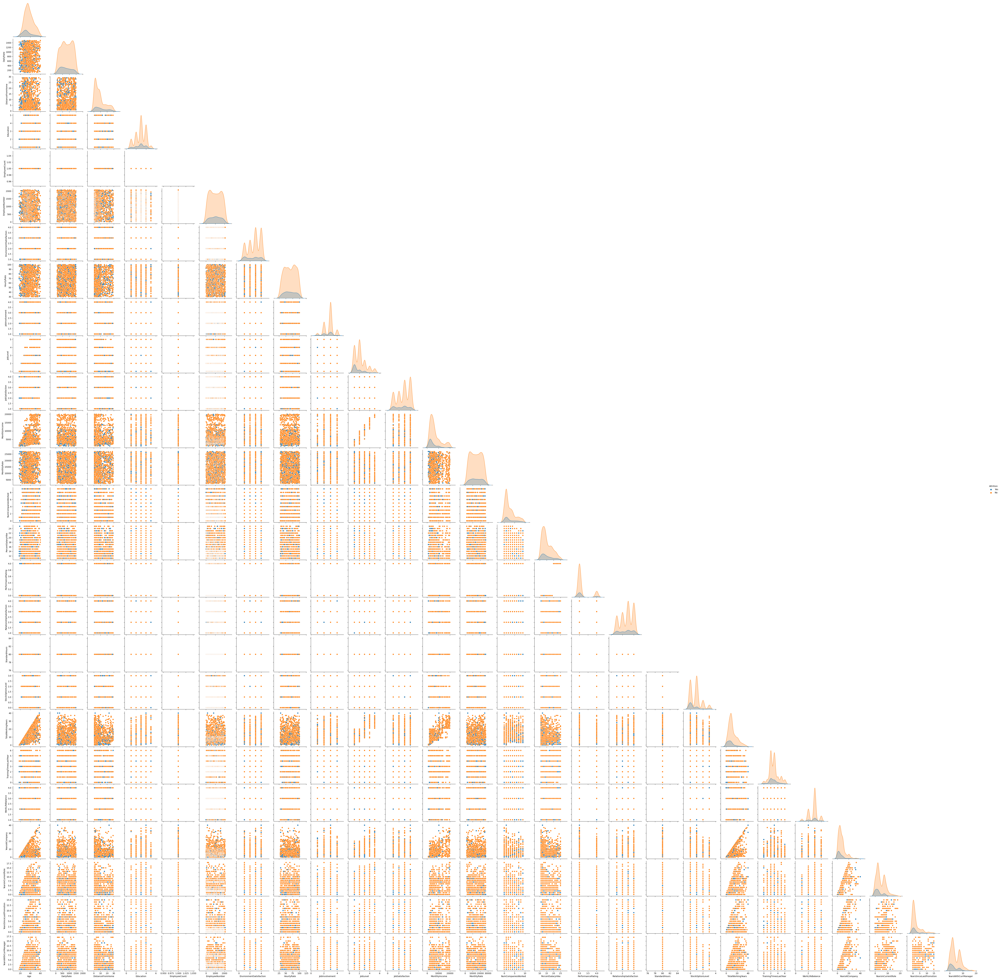

In [20]:
sns.pairplot(attr, hue='Attrition', corner=True)

C:\Users\sagar\AppData\Local\Temp\ipykernel_3632\2496326142.py:4: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.histplot(attr,x='MonthlyIncome',palette='icefire')


Text(0.5, 0, 'Monthly Income')

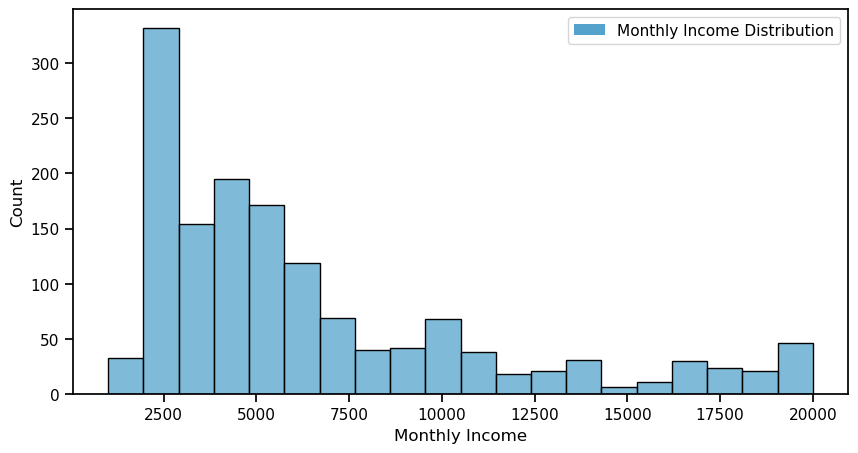

In [18]:
sns.set_context('notebook')
sns.set_palette('icefire')
plt.figure(figsize=(10,5))
sns.histplot(attr,x='MonthlyIncome',palette='icefire')
plt.legend(['Monthly Income Distribution'])
plt.xlabel("Monthly Income")

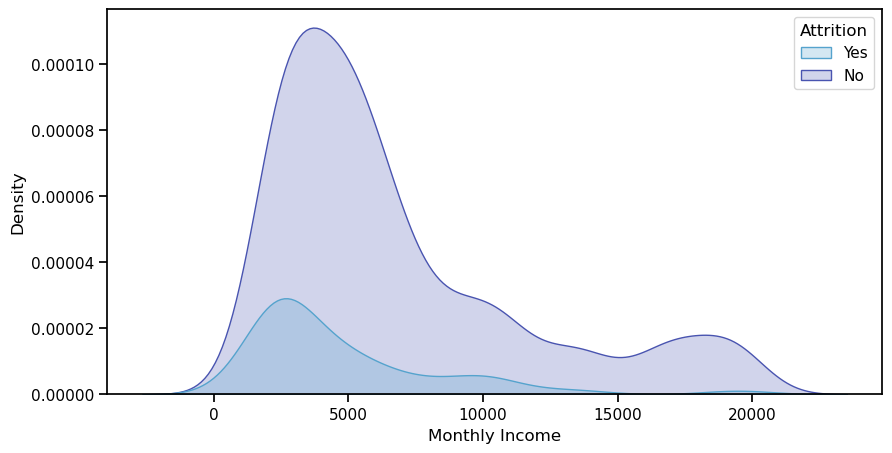

In [19]:
plt.figure(figsize=(10,5))
sns.kdeplot(data=attr,x='MonthlyIncome',hue='Attrition',fill=True)
plt.xlabel('Monthly Income')
plt.show()

C:\Users\sagar\AppData\Local\Temp\ipykernel_3632\3779362866.py:4: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.histplot(attr,x='MonthlyRate',palette='icefire')


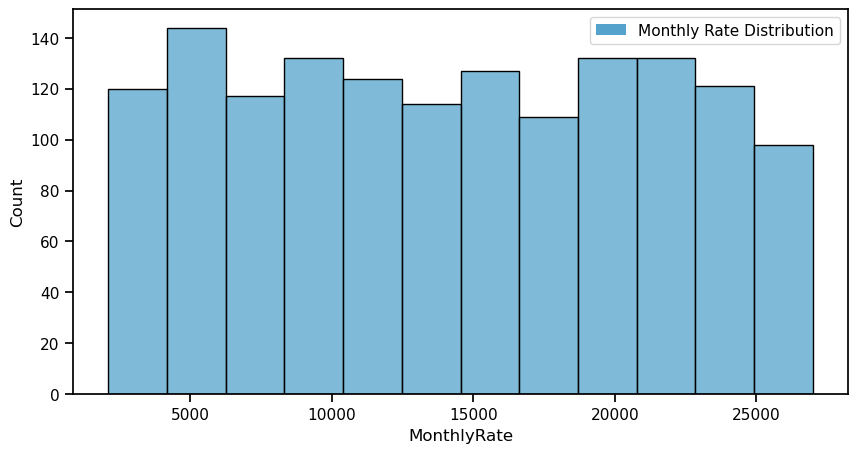

In [6]:
sns.set_context('notebook')
sns.set_palette('icefire')
plt.figure(figsize=(10,5))
sns.histplot(attr,x='MonthlyRate',palette='icefire')
plt.legend(['Monthly Rate Distribution'])

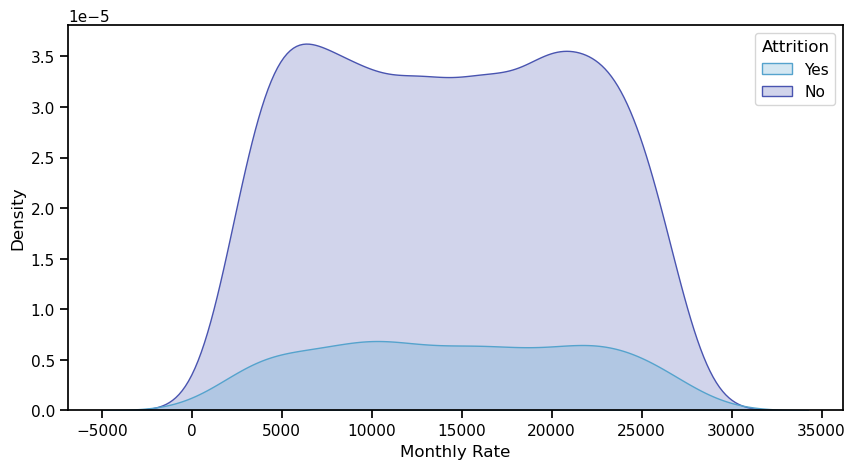

In [20]:
plt.figure(figsize=(10,5))
sns.kdeplot(data=attr,x='MonthlyRate',hue='Attrition',fill=True)
plt.xlabel('Monthly Rate')
plt.show()

C:\Users\sagar\AppData\Local\Temp\ipykernel_3632\2192527616.py:4: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.histplot(attr,x='DailyRate',palette='icefire')


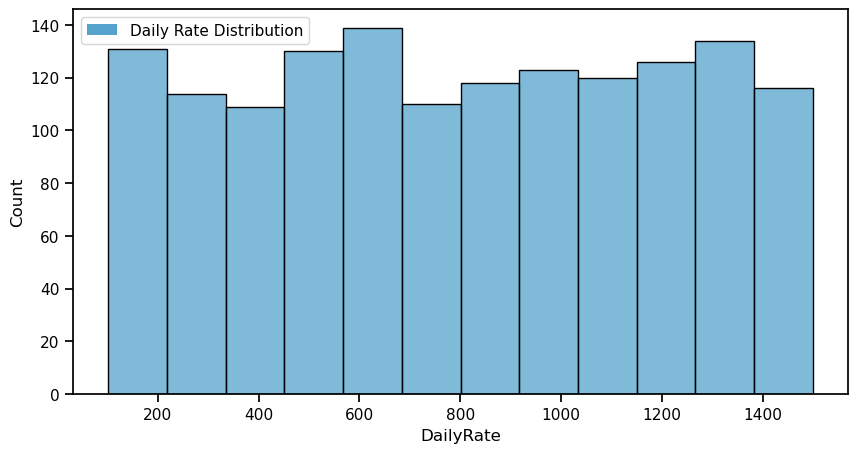

In [21]:
sns.set_context('notebook')
sns.set_palette('icefire')
plt.figure(figsize=(10,5))
sns.histplot(attr,x='DailyRate',palette='icefire')
plt.legend(['Daily Rate Distribution'])

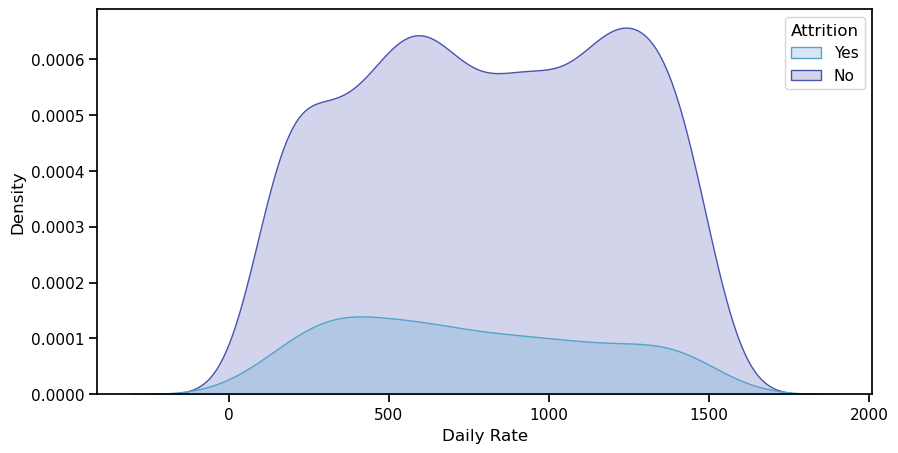

In [22]:
plt.figure(figsize=(10,5))
sns.kdeplot(data=attr,x='DailyRate',hue='Attrition',fill=True)
plt.xlabel('Daily Rate')
plt.show()

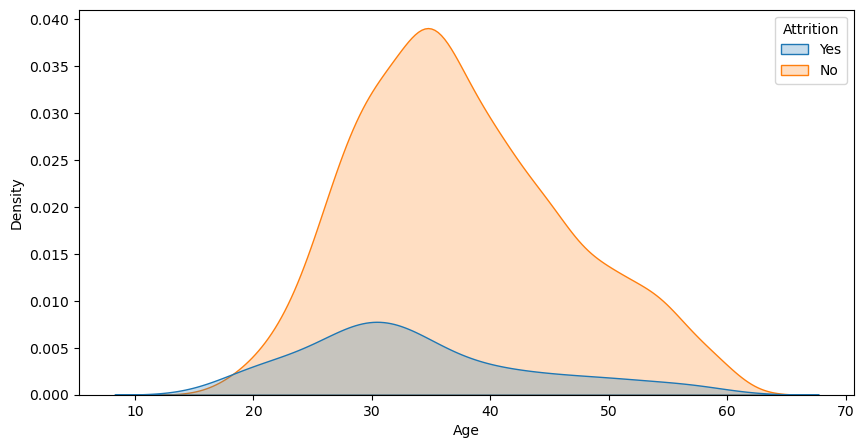

In [4]:
plt.figure(figsize=(10,5))
sns.kdeplot(data=attr,x='Age',hue='Attrition',fill=True)
plt.xlabel('Age')
plt.show()

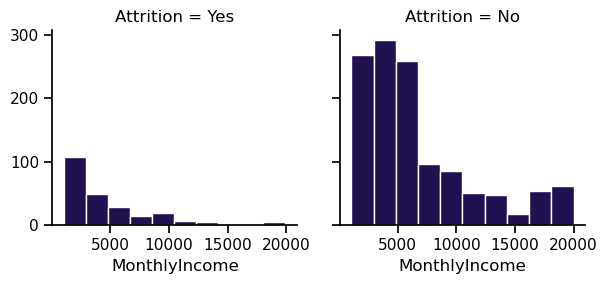

In [12]:
sns.set_palette('magma')
graph = sns.FacetGrid(attr, col ="Attrition")
graph.map(plt.hist, "MonthlyIncome", edgecolor ="w").add_legend()

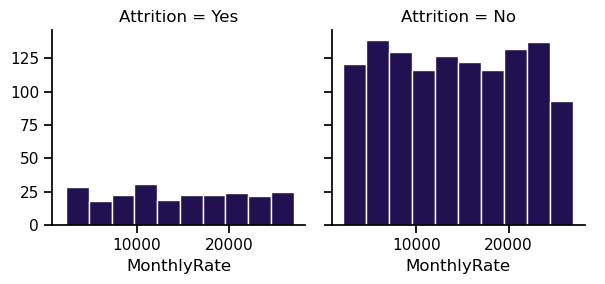

In [13]:
sns.set_palette('magma')
graph = sns.FacetGrid(attr, col ="Attrition")
graph.map(plt.hist, "MonthlyRate", edgecolor ="w").add_legend()

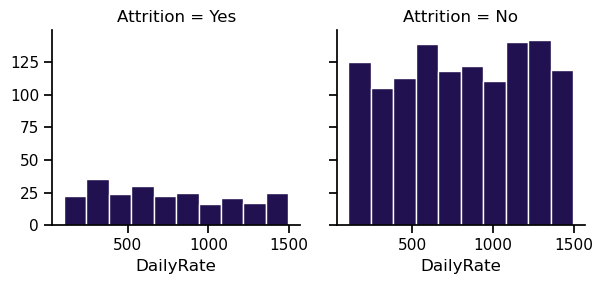

In [15]:
sns.set_palette('magma')
graph = sns.FacetGrid(attr, col ="Attrition")
graph.map(plt.hist, "DailyRate", edgecolor ="w").add_legend()

<Axes: xlabel='Attrition', ylabel='MonthlyIncome'>

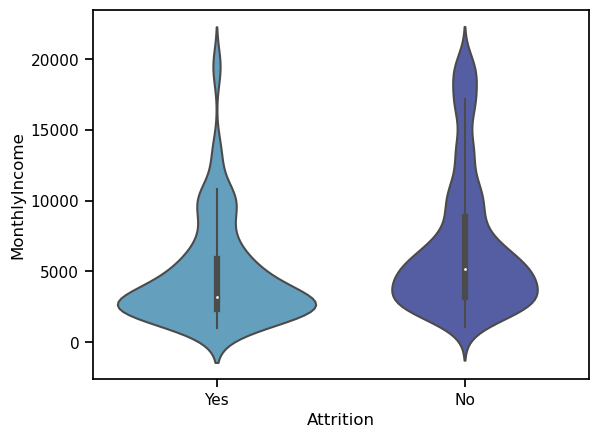

In [23]:
sns.violinplot(x="Attrition", y="MonthlyIncome", data=attr)

In [24]:
attr.columns

Index(['Age', 'Attrition', 'BusinessTravel', 'DailyRate', 'Department',
       'DistanceFromHome', 'Education', 'EducationField', 'EmployeeCount',
       'EmployeeNumber', 'EnvironmentSatisfaction', 'Gender', 'HourlyRate',
       'JobInvolvement', 'JobLevel', 'JobRole', 'JobSatisfaction',
       'MaritalStatus', 'MonthlyIncome', 'MonthlyRate', 'NumCompaniesWorked',
       'Over18', 'OverTime', 'PercentSalaryHike', 'PerformanceRating',
       'RelationshipSatisfaction', 'StandardHours', 'StockOptionLevel',
       'TotalWorkingYears', 'TrainingTimesLastYear', 'WorkLifeBalance',
       'YearsAtCompany', 'YearsInCurrentRole', 'YearsSinceLastPromotion',
       'YearsWithCurrManager'],
      dtype='object')

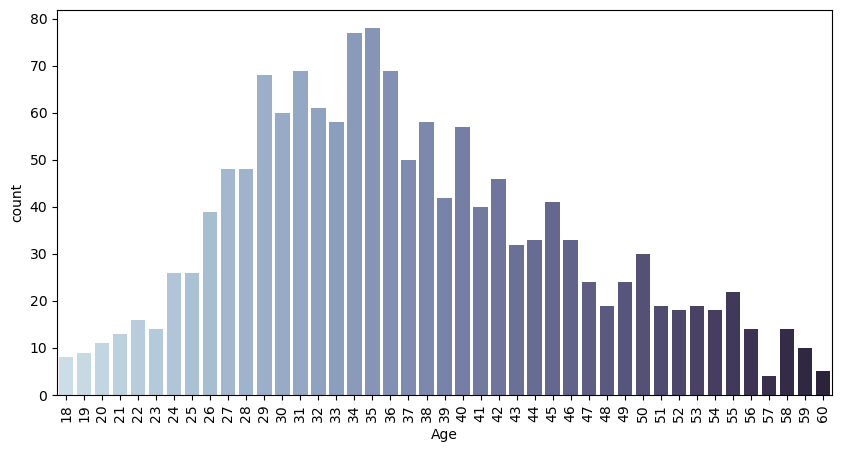

In [22]:
plt.figure(figsize=(10,5))
sns.countplot(data=attr,x='Age',palette="ch:s=.25,rot=-.25")
plt.xticks(rotation=90)
plt.show()

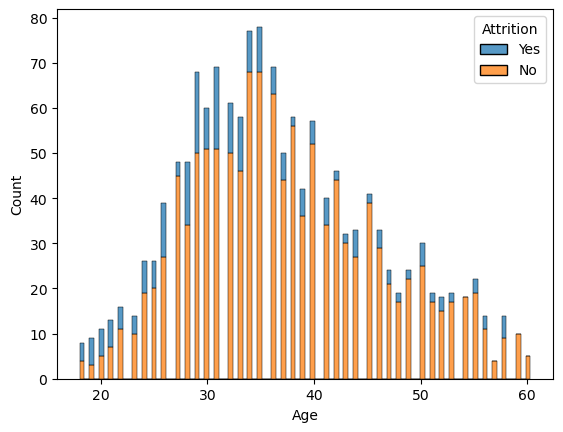

In [10]:
sns.histplot(binwidth=0.45, x="Age", hue="Attrition", data=attr, stat="count", multiple="stack")
plt.show()

In [27]:
attr.BusinessTravel.value_counts()

Travel_Rarely        1043
Travel_Frequently     277
Non-Travel            150
Name: BusinessTravel, dtype: int64

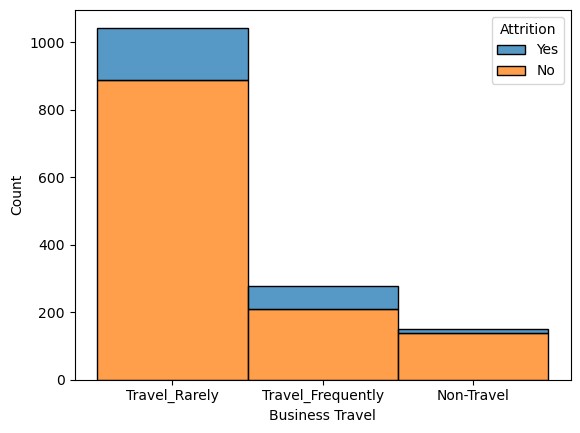

In [55]:
ax=sns.histplot(binwidth=0.45, x="BusinessTravel", hue="Attrition", data=attr, stat="count", multiple="stack")
ax.set_xlabel("Business Travel")
plt.xticks([0, 1, 2], ['Travel_Rarely', 'Travel_Frequently', 'Non-Travel'])
plt.show()

In [34]:
attr.Department.value_counts()

Research & Development    961
Sales                     446
Human Resources            63
Name: Department, dtype: int64

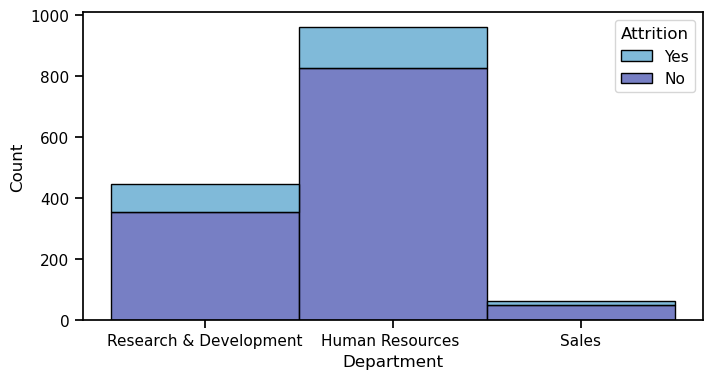

In [48]:
plt.figure(figsize=(8,4))
histplot=sns.histplot(binwidth=0.45, x="Department", hue="Attrition", data=attr, stat="count", multiple="stack")
plt.xticks([0, 1, 2], ['Research & Development', 'Human Resources ', 'Sales'])
plt.show()

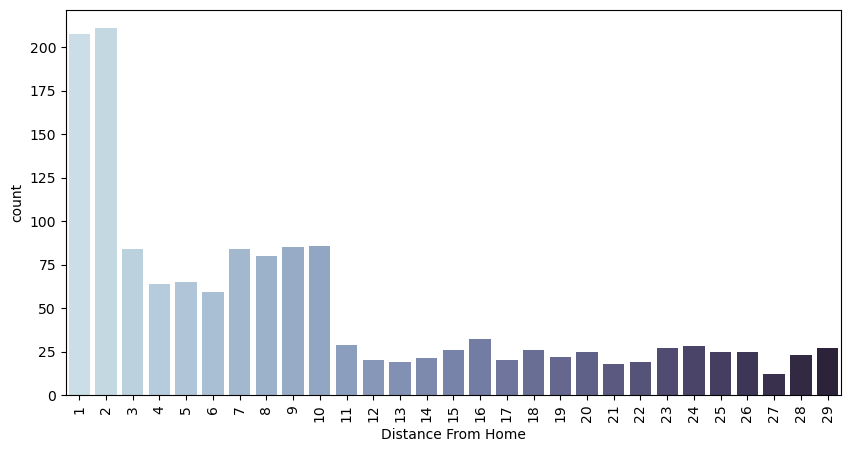

In [54]:
plt.figure(figsize=(10,5))
ax = sns.countplot(data=attr,x='DistanceFromHome',palette="ch:s=.25,rot=-.25")
ax.set_xlabel("Distance From Home")
plt.xticks(rotation=90)
plt.show()

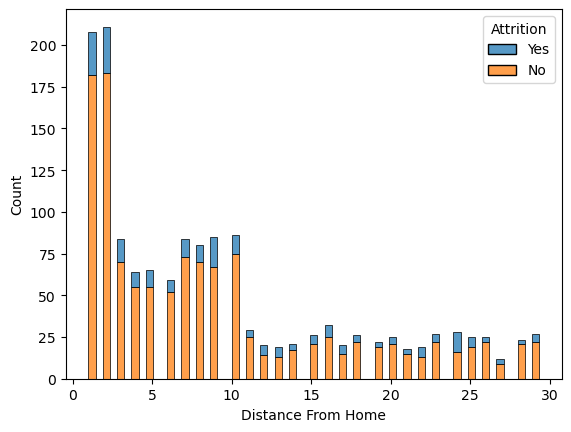

In [53]:
ax = sns.histplot(binwidth=0.45, x="DistanceFromHome", hue="Attrition", data=attr, stat="count", multiple="stack")
ax.set_xlabel("Distance From Home")
plt.show()

In [26]:
attr.Education.value_counts()

3    572
4    398
2    282
1    170
5     48
Name: Education, dtype: int64

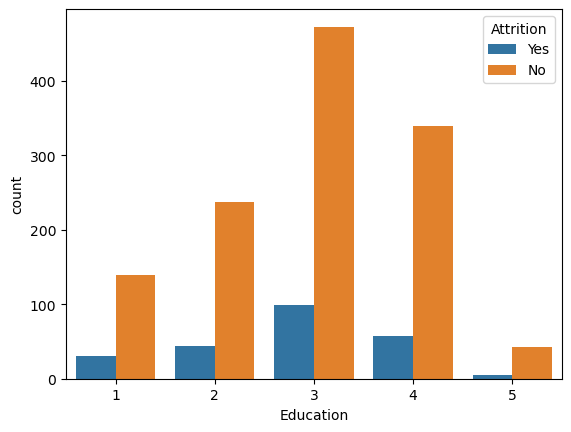

In [33]:
sns.countplot(data=attr,x='Education',hue='Attrition')
plt.show()


In [34]:
attr.EducationField.value_counts()

Life Sciences       606
Medical             464
Marketing           159
Technical Degree    132
Other                82
Human Resources      27
Name: EducationField, dtype: int64

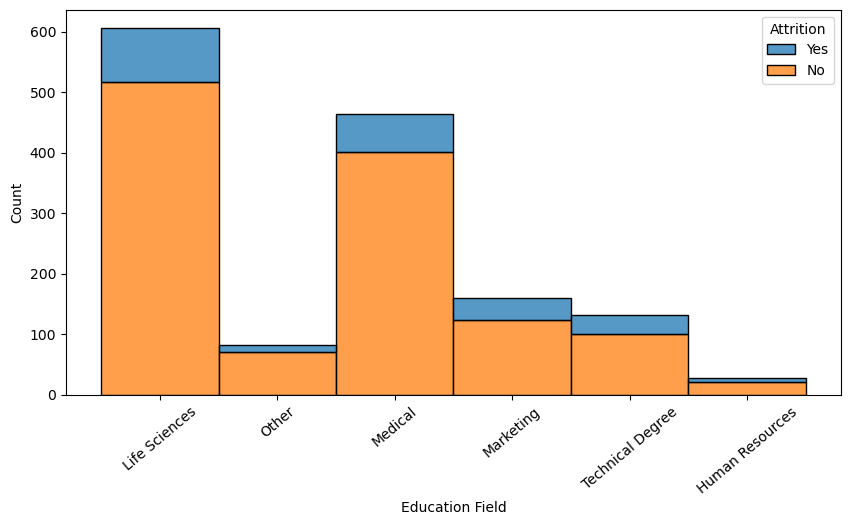

In [52]:
plt.figure(figsize=(10,5))
ax=histplot=sns.histplot( x="EducationField", hue="Attrition", data=attr, stat="count", multiple="stack")
ax.set_xlabel("Education Field")
plt.xticks(rotation=40)
plt.show()

In [7]:
attr.EmployeeCount.value_counts()

1    1470
Name: EmployeeCount, dtype: int64

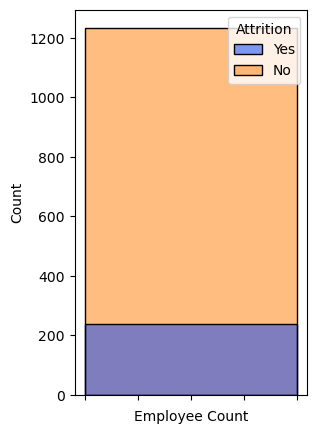

In [42]:
plt.figure(figsize=(3, 5))
ax = sns.histplot(data=attr, x="EmployeeCount", hue="Attrition", palette="bright")
ax.set_xlabel("Employee Count")
ax.set_xticklabels([])
plt.show()

In [8]:
attr.EnvironmentSatisfaction.value_counts()

3    453
4    446
2    287
1    284
Name: EnvironmentSatisfaction, dtype: int64

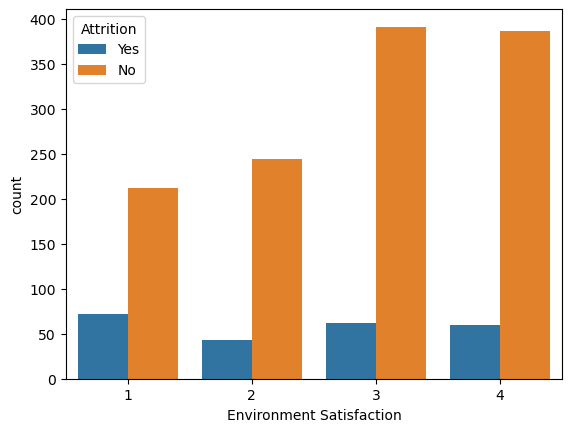

In [51]:
ax=sns.countplot(data=attr,x='EnvironmentSatisfaction',hue='Attrition')
ax.set_xlabel("Environment Satisfaction")
plt.show()

In [10]:
attr.Gender.value_counts()

Male      882
Female    588
Name: Gender, dtype: int64

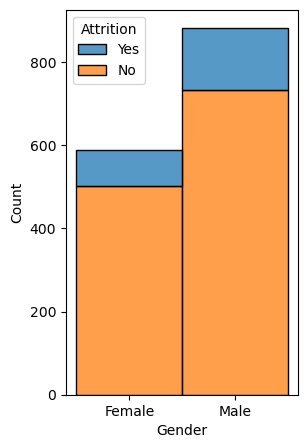

In [18]:
plt.figure(figsize=(3, 5))
histplot=sns.histplot(binwidth=0.45, x="Gender", hue="Attrition", data=attr, stat="count", multiple="stack")
plt.show()

In [19]:
attr.HourlyRate.value_counts()

66    29
98    28
42    28
48    28
84    28
      ..
31    15
53    14
68    14
38    13
34    12
Name: HourlyRate, Length: 71, dtype: int64

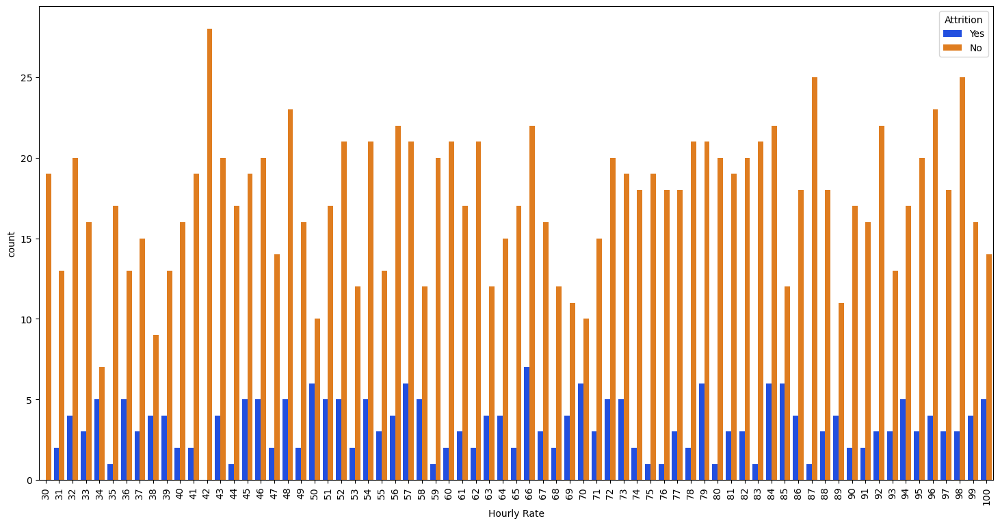

In [50]:
plt.figure(figsize=(18,9))
ax=sns.countplot(data=attr,x='HourlyRate',hue="Attrition", palette="bright")
ax.set_xlabel("Hourly Rate")
plt.xticks(rotation=90)
plt.show()

In [29]:
attr.JobInvolvement.value_counts()

3    868
2    375
4    144
1     83
Name: JobInvolvement, dtype: int64

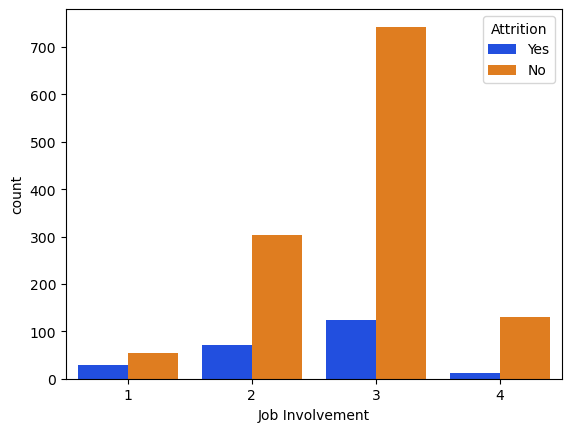

In [86]:
ax=sns.countplot(data=attr,x='JobInvolvement',hue='Attrition', palette="bright")
ax.set_xlabel("Job Involvement")
plt.show()

In [43]:
attr.JobLevel.value_counts()

1    543
2    534
3    218
4    106
5     69
Name: JobLevel, dtype: int64

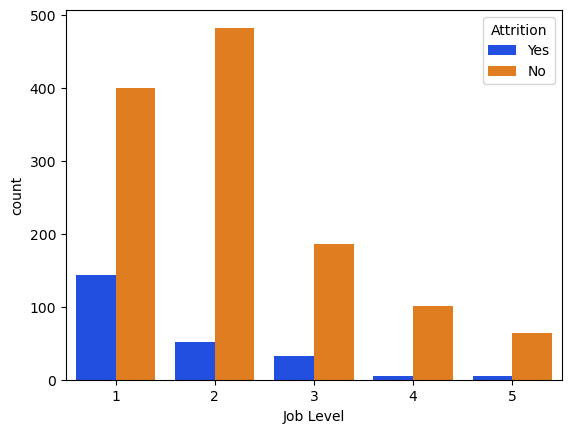

In [88]:
ax = sns.countplot(x="JobLevel", hue="Attrition", data=attr, palette="bright")
ax.set_xlabel("Job Level")
plt.show()

In [69]:
attr.JobRole.value_counts()

Sales Executive              326
Research Scientist           292
Laboratory Technician        259
Manufacturing Director       145
Healthcare Representative    131
Manager                      102
Sales Representative          83
Research Director             80
Human Resources               52
Name: JobRole, dtype: int64

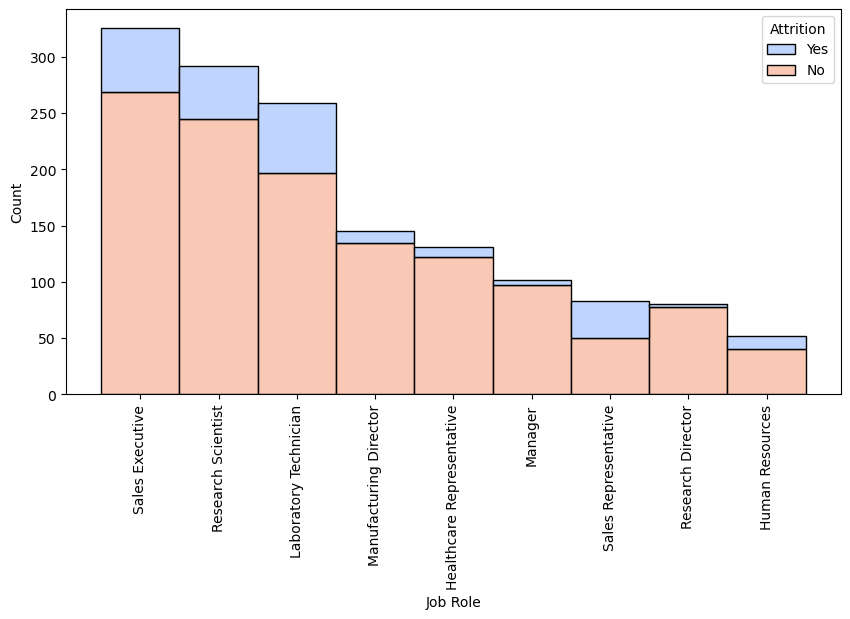

In [83]:
plt.figure(figsize=(10,5))
ax=sns.histplot( x="JobRole", hue="Attrition", data=attr, stat="count", multiple="stack", palette="coolwarm")
ax.set_xlabel("Job Role")
plt.xticks(rotation=90)
plt.show()

In [84]:
attr.JobSatisfaction.value_counts()

4    459
3    442
1    289
2    280
Name: JobSatisfaction, dtype: int64

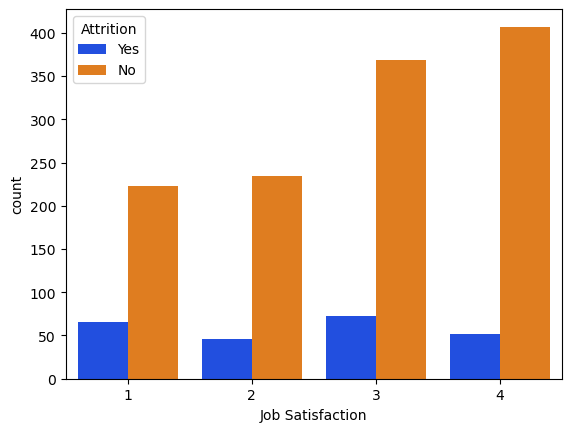

In [85]:
ax=sns.countplot(data=attr,x='JobSatisfaction',hue='Attrition', palette="bright")
ax.set_xlabel("Job Satisfaction")
plt.show()

In [89]:
attr.MaritalStatus.value_counts()

Married     673
Single      470
Divorced    327
Name: MaritalStatus, dtype: int64

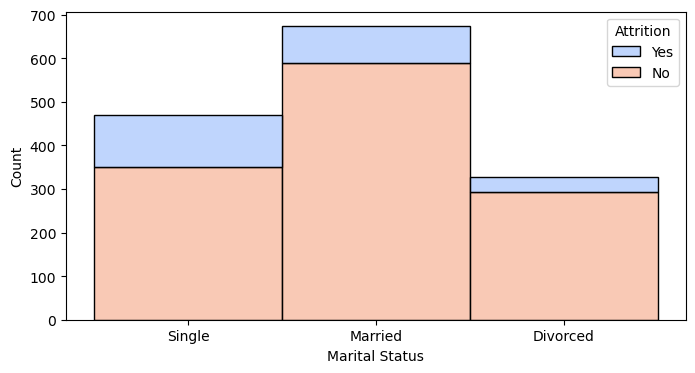

In [92]:
plt.figure(figsize=(8,4))
ax=sns.histplot( x="MaritalStatus", hue="Attrition", data=attr, stat="count", multiple="stack", palette="coolwarm")
ax.set_xlabel("Marital Status")
plt.show()

In [93]:
attr.NumCompaniesWorked.value_counts()

1    521
0    197
3    159
2    146
4    139
7     74
6     70
5     63
9     52
8     49
Name: NumCompaniesWorked, dtype: int64

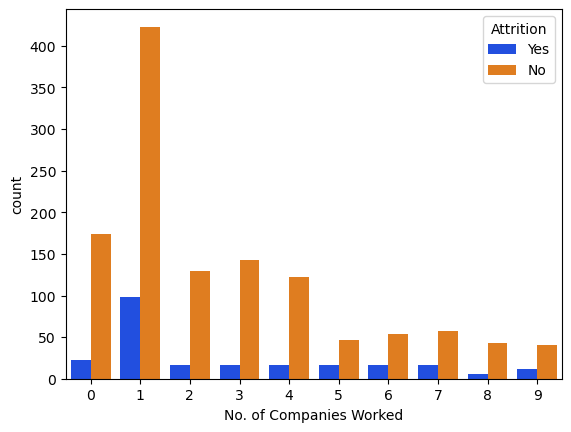

In [94]:
ax=sns.countplot(data=attr,x='NumCompaniesWorked',hue='Attrition', palette="bright")
ax.set_xlabel("No. of Companies Worked")
plt.show()

In [95]:
attr.Over18.value_counts()

Y    1470
Name: Over18, dtype: int64

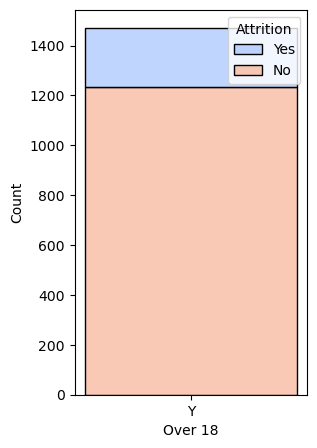

In [96]:
plt.figure(figsize=(3,5))
ax=sns.histplot( x="Over18", hue="Attrition", data=attr, stat="count", multiple="stack", palette="coolwarm")
ax.set_xlabel("Over 18")
#plt.xticks(rotation=90)
plt.show()

In [97]:
attr.OverTime.value_counts()

No     1054
Yes     416
Name: OverTime, dtype: int64

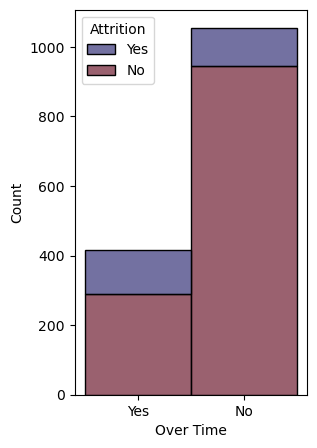

In [101]:
plt.figure(figsize=(3,5))
ax=sns.histplot( x="OverTime", hue="Attrition", data=attr, stat="count", multiple="stack", palette="icefire")
ax.set_xlabel("Over Time")
plt.show()

In [102]:
attr.PercentSalaryHike.value_counts()

11    210
13    209
14    201
12    198
15    101
18     89
17     82
16     78
19     76
22     56
20     55
21     48
23     28
24     21
25     18
Name: PercentSalaryHike, dtype: int64

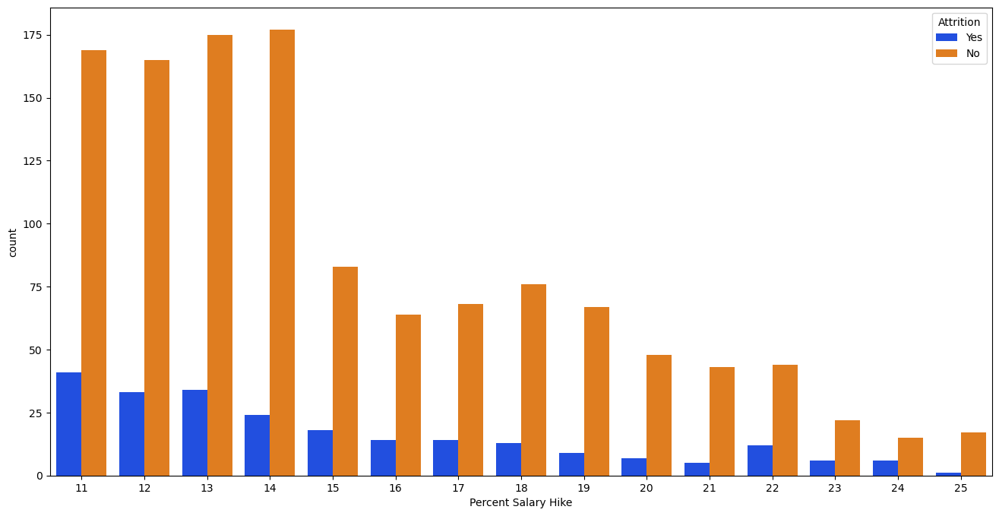

In [104]:
plt.figure(figsize=(16,8))
ax=sns.countplot(data=attr,x='PercentSalaryHike',hue='Attrition', palette="bright")
ax.set_xlabel("Percent Salary Hike")
plt.show()

In [105]:
attr.PerformanceRating.value_counts()

3    1244
4     226
Name: PerformanceRating, dtype: int64

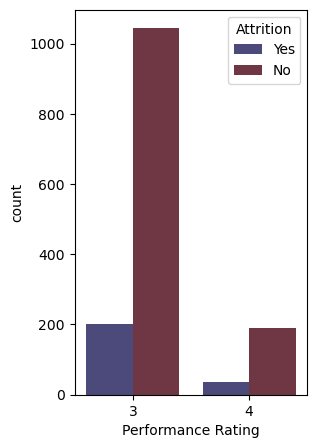

In [107]:
plt.figure(figsize=(3,5))
ax=sns.countplot( x="PerformanceRating", hue="Attrition", data=attr, palette="icefire")
ax.set_xlabel("Performance Rating")
plt.show()

In [108]:
attr.RelationshipSatisfaction.value_counts()

3    459
4    432
2    303
1    276
Name: RelationshipSatisfaction, dtype: int64

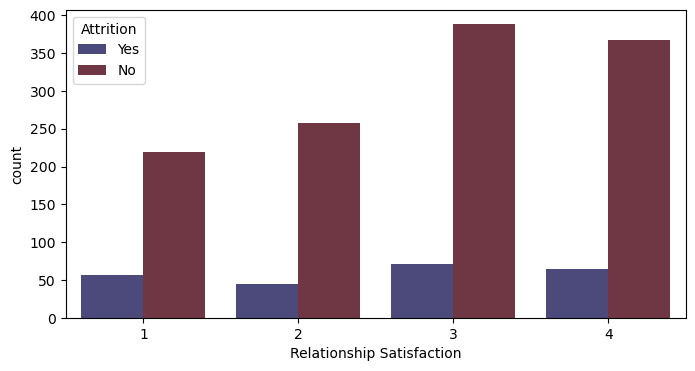

In [109]:
plt.figure(figsize=(8,4))
ax=sns.countplot( x="RelationshipSatisfaction", hue="Attrition", data=attr, palette="icefire")
ax.set_xlabel("Relationship Satisfaction")
plt.show()

In [110]:
attr.StandardHours.value_counts()

80    1470
Name: StandardHours, dtype: int64

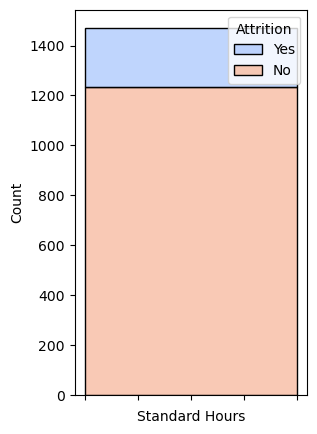

In [112]:
plt.figure(figsize=(3,5))
ax=sns.histplot( x="StandardHours", hue="Attrition", data=attr, stat="count", multiple="stack", palette="coolwarm")
ax.set_xlabel("Standard Hours")
ax.set_xticklabels([])
plt.show()

In [113]:
attr.StockOptionLevel.value_counts()

0    631
1    596
2    158
3     85
Name: StockOptionLevel, dtype: int64

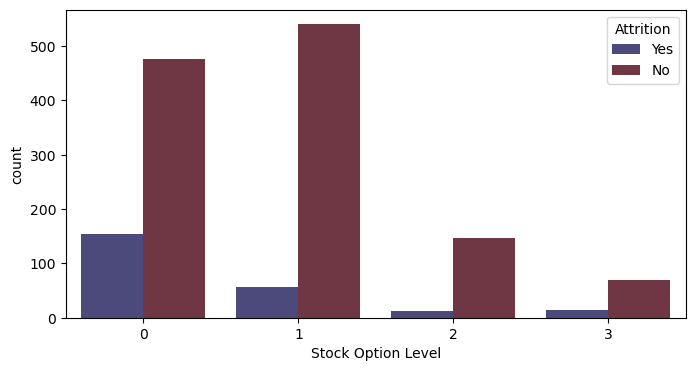

In [114]:
plt.figure(figsize=(8,4))
ax=sns.countplot( x="StockOptionLevel", hue="Attrition", data=attr, palette="icefire")
ax.set_xlabel("Stock Option Level")
plt.show()

In [116]:
attr.TotalWorkingYears.value_counts()

10    202
6     125
8     103
9      96
5      88
7      81
1      81
4      63
12     48
3      42
15     40
16     37
11     36
13     36
21     34
17     33
2      31
14     31
20     30
18     27
19     22
23     22
22     21
24     18
25     14
28     14
26     14
0      11
29     10
31      9
32      9
30      7
33      7
27      7
36      6
34      5
37      4
35      3
40      2
38      1
Name: TotalWorkingYears, dtype: int64

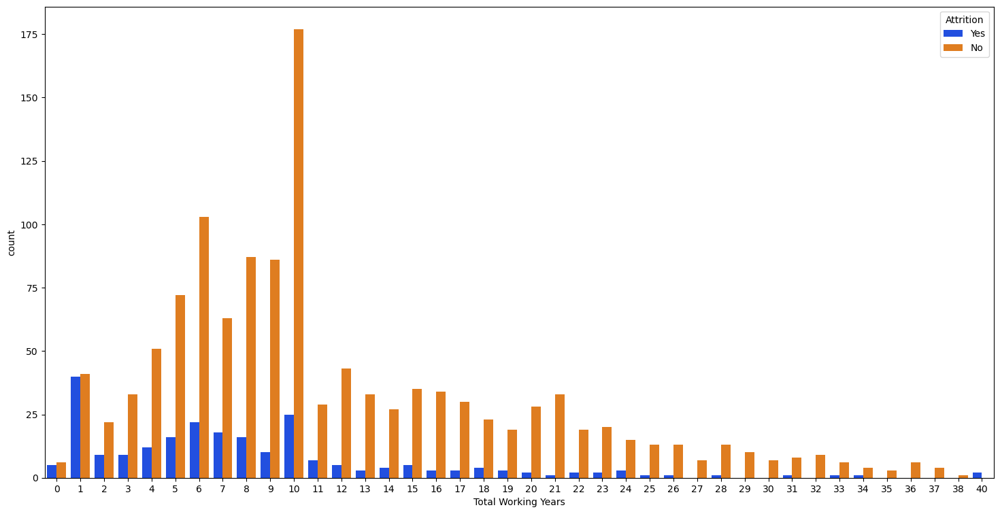

In [135]:
plt.figure(figsize=(18,9))
ax=sns.countplot(data=attr,x='TotalWorkingYears',hue='Attrition', palette="bright")
ax.set_xlabel("Total Working Years")
plt.show()

In [118]:
attr.TrainingTimesLastYear.value_counts()

2    547
3    491
4    123
5    119
1     71
6     65
0     54
Name: TrainingTimesLastYear, dtype: int64

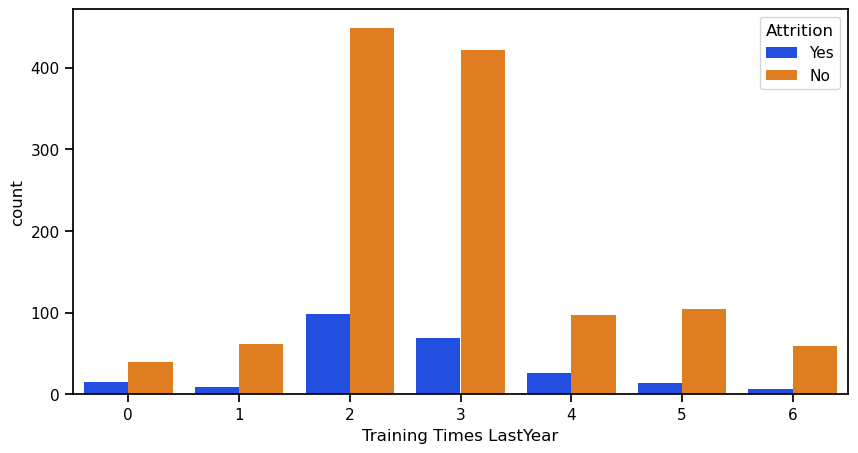

In [139]:
plt.figure(figsize=(10,5))
ax=sns.countplot(data=attr,x='TrainingTimesLastYear',hue='Attrition', palette="bright")
ax.set_xlabel("Training Times LastYear")
plt.show()

In [123]:
attr.WorkLifeBalance.value_counts()

3    893
2    344
4    153
1     80
Name: WorkLifeBalance, dtype: int64

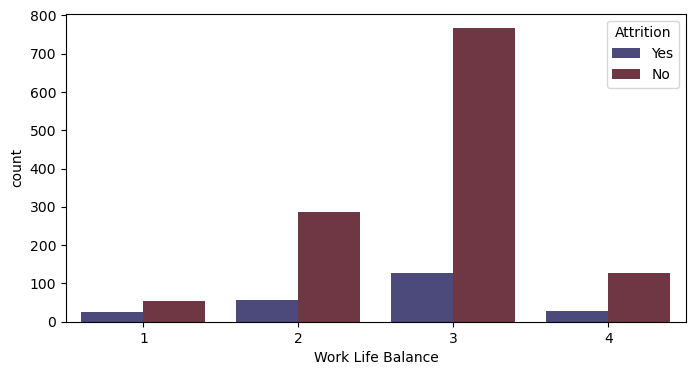

In [124]:
plt.figure(figsize=(8,4))
ax=sns.countplot( x="WorkLifeBalance", hue="Attrition", data=attr, palette="icefire")
ax.set_xlabel("Work Life Balance")
plt.show()

In [125]:
attr.YearsAtCompany.value_counts()

5     196
1     171
3     128
2     127
10    120
4     110
7      90
9      82
8      80
6      76
0      44
11     32
20     27
13     24
15     20
14     18
22     15
12     14
21     14
18     13
16     12
19     11
17      9
24      6
33      5
25      4
26      4
31      3
32      3
27      2
36      2
29      2
23      2
37      1
40      1
34      1
30      1
Name: YearsAtCompany, dtype: int64

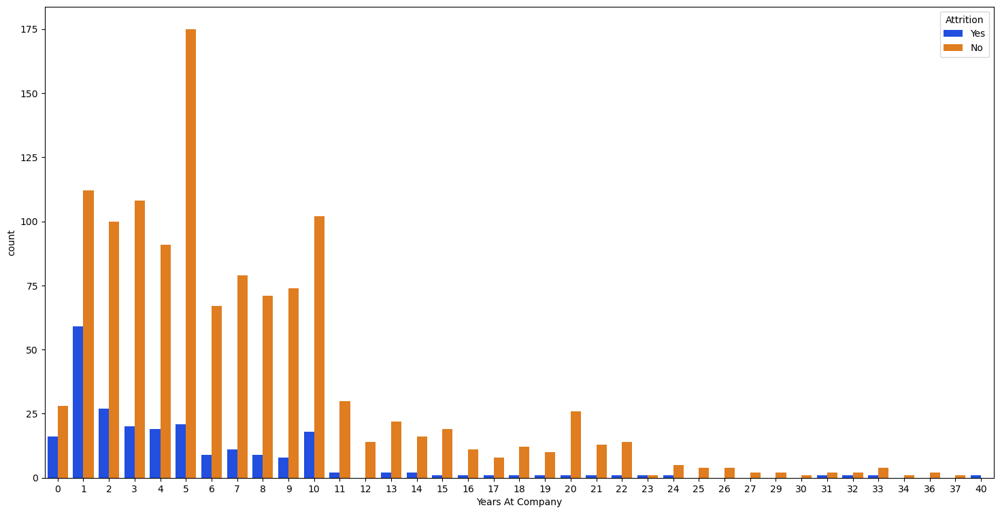

In [126]:
plt.figure(figsize=(18,9))
ax=sns.countplot(data=attr,x='YearsAtCompany',hue='Attrition', palette="bright")
ax.set_xlabel("Years At Company")
plt.show()

In [127]:
attr.YearsInCurrentRole.value_counts()

2     372
0     244
7     222
3     135
4     104
8      89
9      67
1      57
6      37
5      36
10     29
11     22
13     14
14     11
12     10
15      8
16      7
17      4
18      2
Name: YearsInCurrentRole, dtype: int64

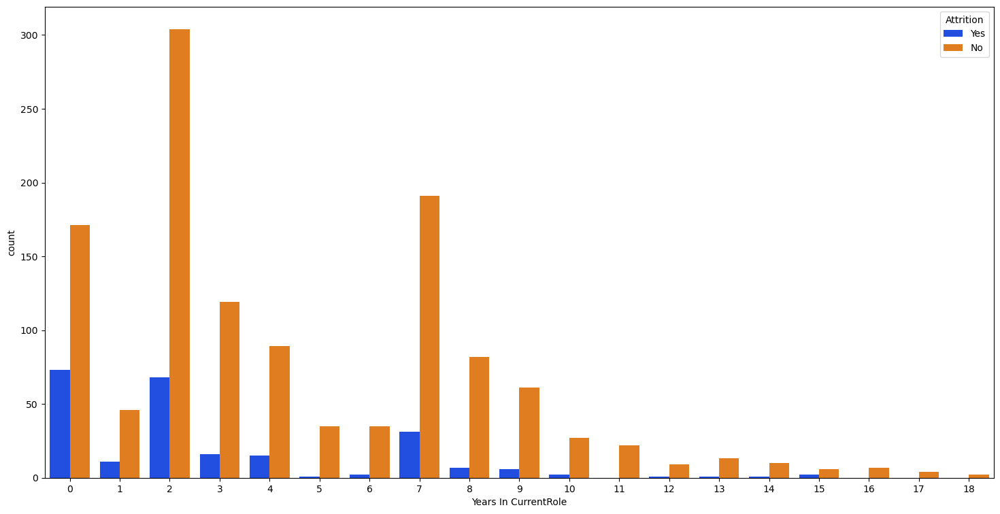

In [128]:
plt.figure(figsize=(18,9))
ax=sns.countplot(data=attr,x='YearsInCurrentRole',hue='Attrition', palette="bright")
ax.set_xlabel("Years In CurrentRole")
plt.show()

In [129]:
attr.YearsSinceLastPromotion.value_counts()

0     581
1     357
2     159
7      76
4      61
3      52
5      45
6      32
11     24
8      18
9      17
15     13
13     10
12     10
14      9
10      6
Name: YearsSinceLastPromotion, dtype: int64

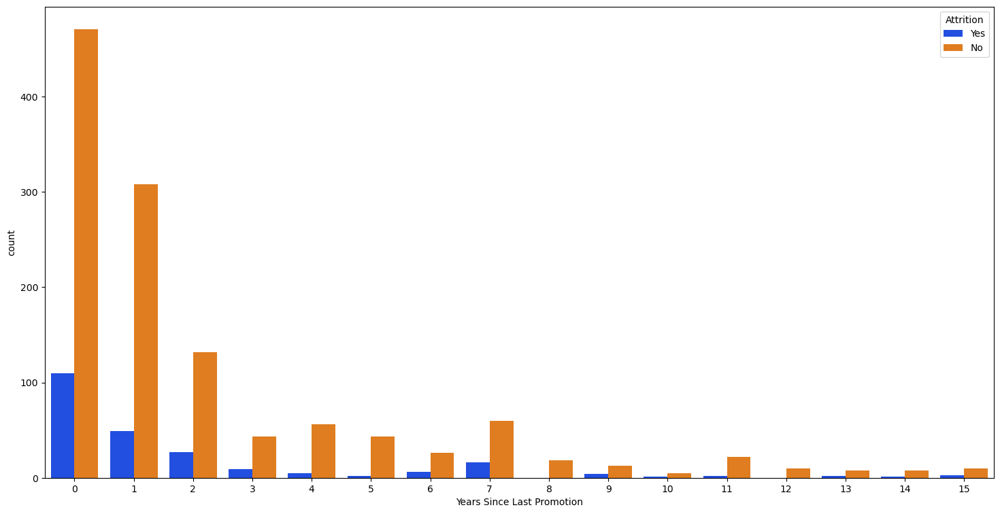

In [132]:
plt.figure(figsize=(18,9))
ax=sns.countplot(data=attr,x='YearsSinceLastPromotion',hue='Attrition', palette="bright")
ax.set_xlabel("Years Since Last Promotion")
plt.show()

In [133]:
attr.YearsWithCurrManager.value_counts()

2     344
0     263
7     216
3     142
8     107
4      98
1      76
9      64
5      31
6      29
10     27
11     22
12     18
13     14
17      7
15      5
14      5
16      2
Name: YearsWithCurrManager, dtype: int64

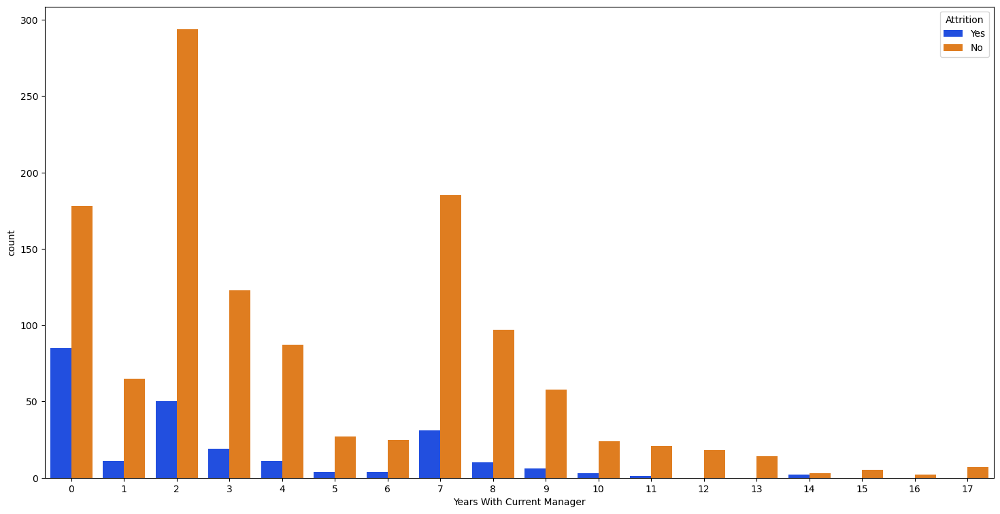

In [16]:
plt.figure(figsize=(18,9))
ax=sns.countplot(data=attr,x='YearsWithCurrManager',hue='Attrition', palette="bright")
ax.set_xlabel("Years With Current Manager")
plt.show()

## Here we are done with Data Visualisation
## Lets Start Building a Model

In [4]:
attr.dtypes

Age                          int64
Attrition                   object
BusinessTravel              object
DailyRate                    int64
Department                  object
DistanceFromHome             int64
Education                    int64
EducationField              object
EmployeeCount                int64
EmployeeNumber               int64
EnvironmentSatisfaction      int64
Gender                      object
HourlyRate                   int64
JobInvolvement               int64
JobLevel                     int64
JobRole                     object
JobSatisfaction              int64
MaritalStatus               object
MonthlyIncome                int64
MonthlyRate                  int64
NumCompaniesWorked           int64
Over18                      object
OverTime                    object
PercentSalaryHike            int64
PerformanceRating            int64
RelationshipSatisfaction     int64
StandardHours                int64
StockOptionLevel             int64
TotalWorkingYears   

In [5]:
attr.Attrition.unique()

array(['Yes', 'No'], dtype=object)

In [6]:
attr.Attrition.value_counts()

No     1233
Yes     237
Name: Attrition, dtype: int64

In [7]:
attr_c = attr

In [8]:
attr_c.head()

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,1,1,...,1,80,0,8,0,1,6,4,0,5
1,49,No,Travel_Frequently,279,Research & Development,8,1,Life Sciences,1,2,...,4,80,1,10,3,3,10,7,1,7
2,37,Yes,Travel_Rarely,1373,Research & Development,2,2,Other,1,4,...,2,80,0,7,3,3,0,0,0,0
3,33,No,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,1,5,...,3,80,0,8,3,3,8,7,3,0
4,27,No,Travel_Rarely,591,Research & Development,2,1,Medical,1,7,...,4,80,1,6,3,3,2,2,2,2


In [9]:
d = {'Yes': 1, 'No': 0}
attr_c['Attrition'] = attr_c['Attrition'].map(d)

In [10]:
attr_c.head()

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,1,Travel_Rarely,1102,Sales,1,2,Life Sciences,1,1,...,1,80,0,8,0,1,6,4,0,5
1,49,0,Travel_Frequently,279,Research & Development,8,1,Life Sciences,1,2,...,4,80,1,10,3,3,10,7,1,7
2,37,1,Travel_Rarely,1373,Research & Development,2,2,Other,1,4,...,2,80,0,7,3,3,0,0,0,0
3,33,0,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,1,5,...,3,80,0,8,3,3,8,7,3,0
4,27,0,Travel_Rarely,591,Research & Development,2,1,Medical,1,7,...,4,80,1,6,3,3,2,2,2,2


In [11]:
attr_c.BusinessTravel.unique()

array(['Travel_Rarely', 'Travel_Frequently', 'Non-Travel'], dtype=object)

In [12]:
d = {'Travel_Rarely': 1, 'Travel_Frequently': 2, 'Non-Travel': 0}
attr_c['BusinessTravel'] = attr_c['BusinessTravel'].map(d)

In [11]:
attr_c.head()

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,1,1,1102,Sales,1,2,Life Sciences,1,1,...,1,80,0,8,0,1,6,4,0,5
1,49,0,2,279,Research & Development,8,1,Life Sciences,1,2,...,4,80,1,10,3,3,10,7,1,7
2,37,1,1,1373,Research & Development,2,2,Other,1,4,...,2,80,0,7,3,3,0,0,0,0
3,33,0,2,1392,Research & Development,3,4,Life Sciences,1,5,...,3,80,0,8,3,3,8,7,3,0
4,27,0,1,591,Research & Development,2,1,Medical,1,7,...,4,80,1,6,3,3,2,2,2,2


In [13]:
attr_c.Department.unique()

array(['Sales', 'Research & Development', 'Human Resources'], dtype=object)

In [14]:
d = {'Sales': 1, 'Research & Development': 2, 'Human Resources': 0}
attr_c['Department'] = attr_c['Department'].map(d)

In [15]:
attr_c.head()

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,1,1,1102,1,1,2,Life Sciences,1,1,...,1,80,0,8,0,1,6,4,0,5
1,49,0,2,279,2,8,1,Life Sciences,1,2,...,4,80,1,10,3,3,10,7,1,7
2,37,1,1,1373,2,2,2,Other,1,4,...,2,80,0,7,3,3,0,0,0,0
3,33,0,2,1392,2,3,4,Life Sciences,1,5,...,3,80,0,8,3,3,8,7,3,0
4,27,0,1,591,2,2,1,Medical,1,7,...,4,80,1,6,3,3,2,2,2,2


In [16]:
attr_c.EducationField.unique()

array(['Life Sciences', 'Other', 'Medical', 'Marketing',
       'Technical Degree', 'Human Resources'], dtype=object)

In [17]:
d = {'Life Sciences':0, 'Other':1, 'Medical':2, 'Marketing':3,
       'Technical Degree':4, 'Human Resources':5}
attr_c['EducationField'] = attr_c['EducationField'].map(d)

In [18]:
attr_c.head()

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,1,1,1102,1,1,2,0,1,1,...,1,80,0,8,0,1,6,4,0,5
1,49,0,2,279,2,8,1,0,1,2,...,4,80,1,10,3,3,10,7,1,7
2,37,1,1,1373,2,2,2,1,1,4,...,2,80,0,7,3,3,0,0,0,0
3,33,0,2,1392,2,3,4,0,1,5,...,3,80,0,8,3,3,8,7,3,0
4,27,0,1,591,2,2,1,2,1,7,...,4,80,1,6,3,3,2,2,2,2


In [19]:
attr_c.Gender.unique()

array(['Female', 'Male'], dtype=object)

In [20]:
d = {'Female':0, 'Male':1}
attr_c['Gender'] = attr_c['Gender'].map(d)

In [21]:
attr_c.head().T

,0,1,2,3,4
Age,41,49,37,33,27
Attrition,1,0,1,0,0
BusinessTravel,1,2,1,2,1
DailyRate,1102,279,1373,1392,591
Department,1,2,2,2,2
DistanceFromHome,1,8,2,3,2
Education,2,1,2,4,1
EducationField,0,0,1,0,2
EmployeeCount,1,1,1,1,1
EmployeeNumber,1,2,4,5,7


In [22]:
attr_c.JobRole.unique()

array(['Sales Executive', 'Research Scientist', 'Laboratory Technician',
       'Manufacturing Director', 'Healthcare Representative', 'Manager',
       'Sales Representative', 'Research Director', 'Human Resources'],
      dtype=object)

In [23]:
d = {'Sales Executive':0, 'Research Scientist':1, 'Laboratory Technician':2,
       'Manufacturing Director':3, 'Healthcare Representative':4, 'Manager':5,
       'Sales Representative':6, 'Research Director':7, 'Human Resources':8}
attr_c['JobRole'] = attr_c['JobRole'].map(d)

In [24]:
attr_c.head().T

,0,1,2,3,4
Age,41,49,37,33,27
Attrition,1,0,1,0,0
BusinessTravel,1,2,1,2,1
DailyRate,1102,279,1373,1392,591
Department,1,2,2,2,2
DistanceFromHome,1,8,2,3,2
Education,2,1,2,4,1
EducationField,0,0,1,0,2
EmployeeCount,1,1,1,1,1
EmployeeNumber,1,2,4,5,7


In [25]:
attr_c.MaritalStatus.unique()

array(['Single', 'Married', 'Divorced'], dtype=object)

In [26]:
d = {'Single':0, 'Married':1, 'Divorced':2}
attr_c['MaritalStatus'] = attr_c['MaritalStatus'].map(d)

In [27]:
attr_c.head().T

,0,1,2,3,4
Age,41,49,37,33,27
Attrition,1,0,1,0,0
BusinessTravel,1,2,1,2,1
DailyRate,1102,279,1373,1392,591
Department,1,2,2,2,2
DistanceFromHome,1,8,2,3,2
Education,2,1,2,4,1
EducationField,0,0,1,0,2
EmployeeCount,1,1,1,1,1
EmployeeNumber,1,2,4,5,7


In [28]:
attr_c.Over18.unique()

array(['Y'], dtype=object)

In [29]:
d = {'Y':0}
attr_c['Over18'] = attr_c['Over18'].map(d)

In [30]:
attr_c.head().T

,0,1,2,3,4
Age,41,49,37,33,27
Attrition,1,0,1,0,0
BusinessTravel,1,2,1,2,1
DailyRate,1102,279,1373,1392,591
Department,1,2,2,2,2
DistanceFromHome,1,8,2,3,2
Education,2,1,2,4,1
EducationField,0,0,1,0,2
EmployeeCount,1,1,1,1,1
EmployeeNumber,1,2,4,5,7


In [31]:
attr_c.OverTime.unique()

array(['Yes', 'No'], dtype=object)

In [32]:
d = {'Yes':0, 'No':1}
attr_c['OverTime'] = attr_c['OverTime'].map(d)

In [33]:
attr_c.head().T

,0,1,2,3,4
Age,41,49,37,33,27
Attrition,1,0,1,0,0
BusinessTravel,1,2,1,2,1
DailyRate,1102,279,1373,1392,591
Department,1,2,2,2,2
DistanceFromHome,1,8,2,3,2
Education,2,1,2,4,1
EducationField,0,0,1,0,2
EmployeeCount,1,1,1,1,1
EmployeeNumber,1,2,4,5,7


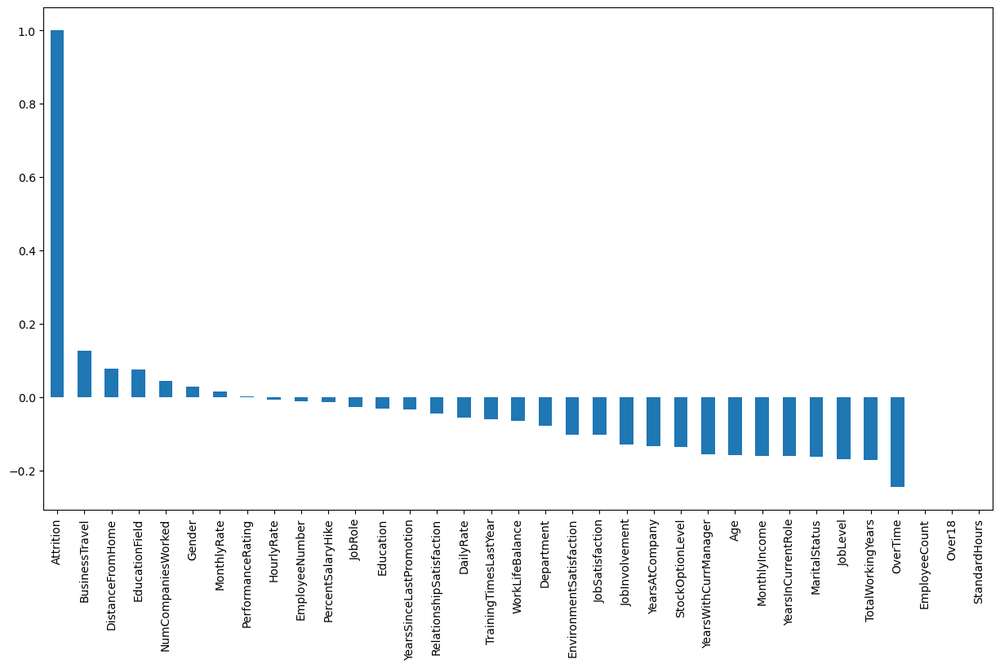

In [34]:
plt.figure(figsize=(15,8))
attr_c.corr()['Attrition'].sort_values(ascending = False).plot(kind='bar')
plt.show()

<Axes: >

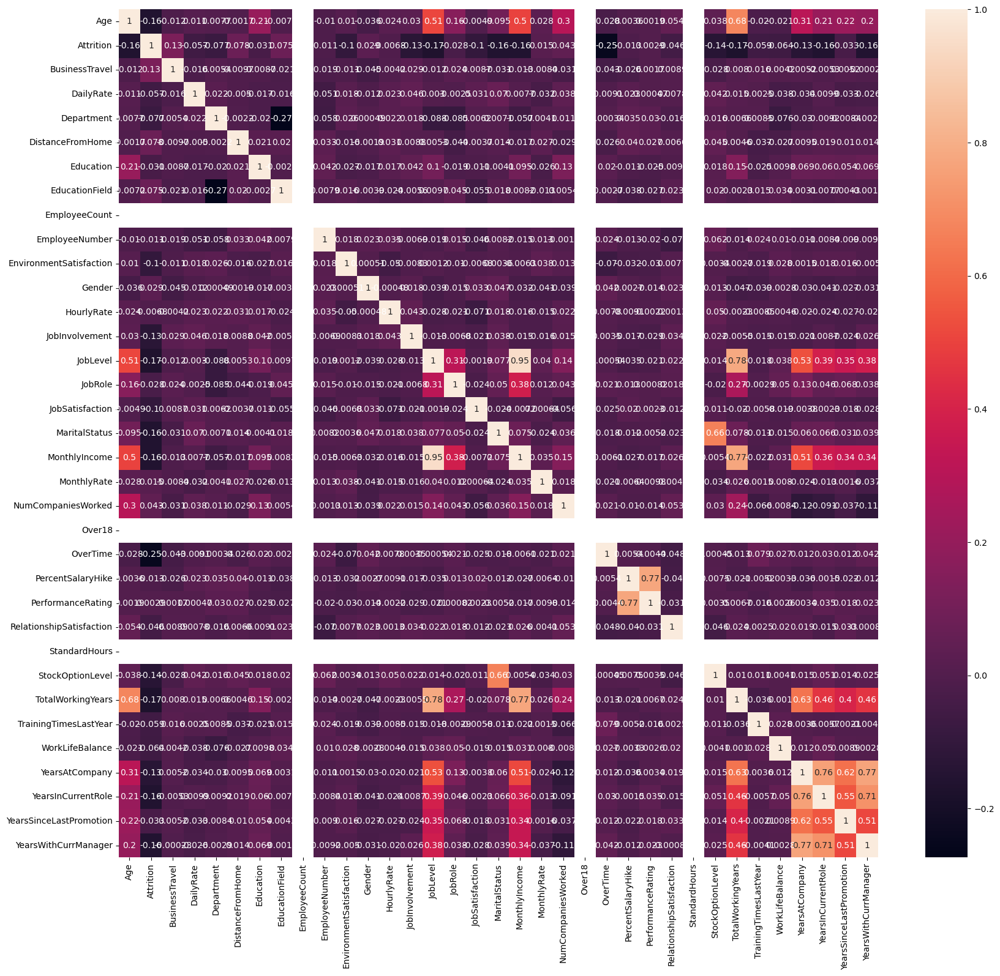

In [35]:
plt.figure(figsize=(20,18))
sns.heatmap(attr_c.corr(), annot=True)

## As Observed we do not need these columns 'EmployeeCount', 'Over18', 'StandardHours'

In [36]:
columns_drop = ['EmployeeCount', 'Over18', 'StandardHours']
attr_d = attr_c.drop(columns=columns_drop)

In [37]:
attr_d.head()

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeNumber,EnvironmentSatisfaction,...,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,1,1,1102,1,1,2,0,1,2,...,3,1,0,8,0,1,6,4,0,5
1,49,0,2,279,2,8,1,0,2,3,...,4,4,1,10,3,3,10,7,1,7
2,37,1,1,1373,2,2,2,1,4,4,...,3,2,0,7,3,3,0,0,0,0
3,33,0,2,1392,2,3,4,0,5,4,...,3,3,0,8,3,3,8,7,3,0
4,27,0,1,591,2,2,1,2,7,1,...,3,4,1,6,3,3,2,2,2,2


In [38]:
attr_d.shape

(1470, 32)

In [39]:
from sklearn.linear_model import LogisticRegression
import statsmodels.api as sm

In [40]:
x = attr_d.drop(['Attrition'],axis=1)
y = attr_d['Attrition']

x = sm.add_constant(x)

In [41]:
## Create a Logistic Regression object lr
lr = LogisticRegression()

In [42]:
logit_model = sm.Logit(y,x)

In [43]:
result = logit_model.fit()

Optimization terminated successfully.
         Current function value: 0.304895
         Iterations 8


In [44]:
result.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:              Attrition   No. Observations:                 1470
Model:                          Logit   Df Residuals:                     1438
Method:                           MLE   Df Model:                           31
Date:                Sun, 23 Jul 2023   Pseudo R-squ.:                  0.3097
Time:                        15:03:05   Log-Likelihood:                -448.20
converged:                       True   LL-Null:                       -649.29
Covariance Type:            nonrobust   LLR p-value:                 3.734e-66
============================================================================================
                               coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------------
const                        6.8291      1.341      5.093      0.000       4.201       9.457
Age                         -0.0315      0.013     -2.381      0.017      -0.057      -0.006
BusinessTravel               0.9209      0.169      5.434      0.000       0.589       1.253
DailyRate                   -0.0003      0.000     -1.285      0.199      -0.001       0.000
Department                  -0.5024      0.164     -3.060      0.002      -0.824      -0.181
DistanceFromHome             0.0432      0.010      4.140      0.000       0.023       0.064
Education                   -0.0040      0.085     -0.047      0.962      -0.170       0.162
EducationField               0.1328      0.063      2.109      0.035       0.009       0.256
EmployeeNumber              -0.0002      0.000     -1.147      0.251      -0.000       0.000
EnvironmentSatisfaction     -0.4072      0.080     -5.073      0.000      -0.565      -0.250
Gender                       0.4102      0.180      2.285      0.022       0.058       0.762
HourlyRate                   0.0005      0.004      0.109      0.913      -0.008       0.009
JobInvolvement              -0.5553      0.120     -4.629      0.000      -0.790      -0.320
JobLevel                    -0.2547      0.284     -0.896      0.370      -0.812       0.303
JobRole                     -0.0034      0.040     -0.085      0.932      -0.082       0.075
JobSatisfaction             -0.4113      0.080     -5.161      0.000      -0.567      -0.255
MaritalStatus               -0.6320      0.169     -3.741      0.000      -0.963      -0.301
MonthlyIncome            -4.872e-05   6.85e-05     -0.712      0.477      -0.000    8.55e-05
MonthlyRate               3.888e-06   1.21e-05      0.320      0.749   -1.99e-05    2.77e-05
NumCompaniesWorked           0.1867      0.037      4.992      0.000       0.113       0.260
OverTime                    -1.8561      0.186    -10.003      0.000      -2.220      -1.492
PercentSalaryHike           -0.0263      0.038     -0.694      0.487      -0.101       0.048
PerformanceRating            0.1615      0.385      0.420      0.674      -0.592       0.915
RelationshipSatisfaction    -0.2719      0.081     -3.377      0.001      -0.430      -0.114
StockOptionLevel            -0.2074      0.148     -1.403      0.161      -0.497       0.082
TotalWorkingYears           -0.0557      0.028     -1.966      0.049      -0.111      -0.000
TrainingTimesLastYear       -0.1588      0.071     -2.251      0.024      -0.297      -0.021
WorkLifeBalance             -0.3335      0.119     -2.812      0.005      -0.566      -0.101
YearsAtCompany               0.0840      0.037      2.253      0.024       0.011       0.157
YearsInCurrentRole          -0.1429      0.044     -3.264      0.001      -0.229      -0.057
YearsSinceLastPromotion      0.1798      0.041      4.348      0.000       0.099       0.261
YearsWithCurrManager        -0.1329      0.046     -2.898      0.004      -0.22

In [45]:
result.summary2()

<class 'statsmodels.iolib.summary2.Summary'>
"""
                             Results: Logit
=========================================================================
Model:                  Logit              Pseudo R-squared:   0.310     
Dependent Variable:     Attrition          AIC:                960.3919  
Date:                   2023-07-23 15:03   BIC:                1129.7685 
No. Observations:       1470               Log-Likelihood:     -448.20   
Df Model:               31                 LL-Null:            -649.29   
Df Residuals:           1438               LLR p-value:        3.7342e-66
Converged:              1.0000             Scale:              1.0000    
No. Iterations:         8.0000                                           
-------------------------------------------------------------------------
                          Coef.  Std.Err.    z     P>|z|   [0.025  0.975]
-------------------------------------------------------------------------
const                     6.8291   1.3409   5.0929 0.0000  4.2010  9.4572
Age                      -0.0315   0.0132  -2.3812 0.0173 -0.0575 -0.0056
BusinessTravel            0.9209   0.1694   5.4345 0.0000  0.5887  1.2530
DailyRate                -0.0003   0.0002  -1.2847 0.1989 -0.0007  0.0001
Department               -0.5024   0.1642  -3.0601 0.0022 -0.8243 -0.1806
DistanceFromHome          0.0432   0.0104   4.1401 0.0000  0.0228  0.0637
Education                -0.0040   0.0848  -0.0472 0.9623 -0.1701  0.1621
EducationField            0.1328   0.0630   2.1095 0.0349  0.0094  0.2562
EmployeeNumber           -0.0002   0.0001  -1.1469 0.2514 -0.0005  0.0001
EnvironmentSatisfaction  -0.4072   0.0803  -5.0728 0.0000 -0.5646 -0.2499
Gender                    0.4102   0.1795   2.2852 0.0223  0.0584  0.7621
HourlyRate                0.0005   0.0043   0.1090 0.9132 -0.0079  0.0088
JobInvolvement           -0.5553   0.1200  -4.6289 0.0000 -0.7905 -0.3202
JobLevel                 -0.2547   0.2843  -0.8957 0.3704 -0.8119  0.3026
JobRole                  -0.0034   0.0399  -0.0848 0.9324 -0.0816  0.0749
JobSatisfaction          -0.4113   0.0797  -5.1610 0.0000 -0.5675 -0.2551
MaritalStatus            -0.6320   0.1689  -3.7408 0.0002 -0.9631 -0.3009
MonthlyIncome            -0.0000   0.0001  -0.7117 0.4767 -0.0002  0.0001
MonthlyRate               0.0000   0.0000   0.3204 0.7487 -0.0000  0.0000
NumCompaniesWorked        0.1867   0.0374   4.9924 0.0000  0.1134  0.2600
OverTime                 -1.8561   0.1856 -10.0031 0.0000 -2.2198 -1.4924
PercentSalaryHike        -0.0263   0.0379  -0.6944 0.4874 -0.1005  0.0479
PerformanceRating         0.1615   0.3846   0.4200 0.6745 -0.5922  0.9153
RelationshipSatisfaction -0.2719   0.0805  -3.3767 0.0007 -0.4297 -0.1141
StockOptionLevel         -0.2074   0.1478  -1.4034 0.1605 -0.4970  0.0823
TotalWorkingYears        -0.0557   0.0283  -1.9659 0.0493 -0.1113 -0.0002
TrainingTimesLastYear    -0.1588   0.0705  -2.2513 0.0244 -0.2970 -0.0205
WorkLifeBalance          -0.3335   0.1186  -2.8117 0.0049 -0.5660 -0.1010
YearsAtCompany            0.0840   0.0373   2.2534 0.0242  0.0109  0.1571
YearsInCurrentRole       -0.1429   0.0438  -3.2644 0.0011 -0.2287 -0.0571
YearsSinceLastPromotion   0.1798   0.0413   4.3482 0.0000  0.0987  0.2608
YearsWithCurrManager     -0.1329   0.0458  -2.8984 0.0038 -0.2227 -0.0430
=========================================================================

"""

## Model Validation

In [46]:
from sklearn.linear_model import LogisticRegression
from  sklearn import metrics
from sklearn.model_selection import train_test_split

In [47]:
from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test = train_test_split(attr_d.drop(['Attrition'],axis=1),attr_d['Attrition'],test_size=0.3,random_state=100)

In [48]:
x_train.head()

,Age,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeNumber,EnvironmentSatisfaction,Gender,...,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
178,46,1,526,1,1,2,3,244,2,0,...,4,3,3,24,2,3,24,13,15,7
971,51,1,1405,2,11,2,4,1367,4,0,...,3,2,0,29,1,2,5,2,0,3
1172,29,1,469,1,10,3,2,1650,3,1,...,3,3,0,8,2,3,5,2,1,4
667,41,1,1085,2,2,4,0,927,2,0,...,3,3,1,10,1,2,7,7,1,0
399,31,1,329,2,1,2,0,530,4,1,...,3,3,1,4,3,3,4,2,3,2


In [49]:
x_test.head()

,Age,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeNumber,EnvironmentSatisfaction,Gender,...,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
880,32,2,116,2,13,3,1,1234,3,0,...,4,3,1,2,2,3,2,2,2,2
152,53,1,1436,1,6,2,3,205,2,1,...,4,4,1,13,3,1,7,7,4,5
1466,39,1,613,2,6,1,2,2062,4,1,...,3,1,1,9,5,3,7,7,1,7
1084,34,1,971,1,1,3,4,1535,4,1,...,3,4,0,10,3,3,10,9,8,6
1086,50,2,333,2,22,5,2,1539,3,1,...,3,4,0,32,2,3,32,6,13,9


In [50]:
logreg = LogisticRegression()
logreg.fit(x_train, y_train)

C:\Users\sagar\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


LogisticRegression()

In [51]:
## Get prediction on test data using trauned model
## Store the prediction in y_pred object
y_pred = logreg.predict(x_test)

In [52]:
print(y_pred)

[0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]


In [53]:
print('Accuracy of the log Regn Classifier on Test data is: {:.2f}'.format(logreg.score(x_test, y_test)))

Accuracy of the log Regn Classifier on Test data is: 0.85


## Building the Confusion Matrix

In [54]:
from sklearn.metrics import confusion_matrix
confusion_matrix = confusion_matrix(y_test, y_pred)
print(confusion_matrix)

[[371   0]
 [ 68   2]]


In [55]:
y_test

880     0
152     0
1466    0
1084    0
1086    0
       ..
882     0
1388    0
380     0
573     1
221     0
Name: Attrition, Length: 441, dtype: int64

In [56]:
import numpy as np

In [57]:
y_pred_df = pd.DataFrame(y_pred)

In [58]:
y_pred_df.head(5)

,0
0,0
1,0
2,0
3,0
4,0


## Confusion Matrix Plot

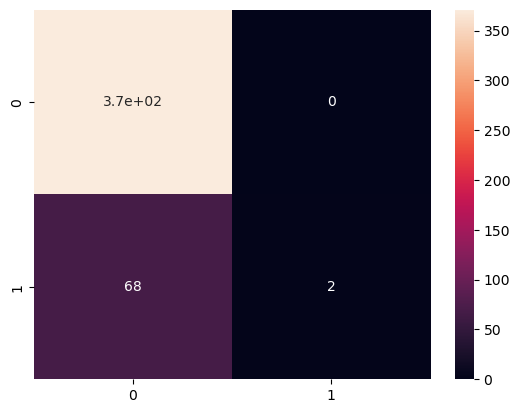

In [59]:
import seaborn as sn
sn.heatmap(confusion_matrix, annot = True)
import matplotlib.pyplot as plt
plt.show()

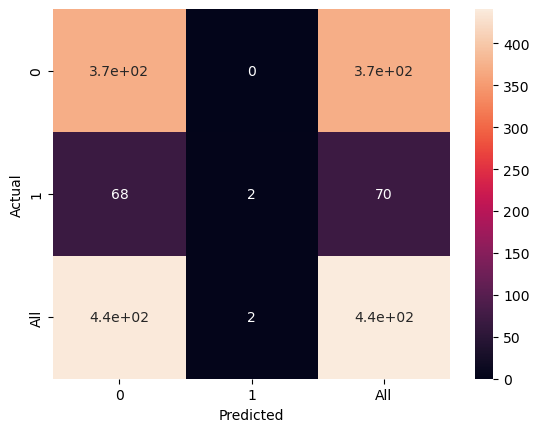

In [60]:
confusion_matrix_new = pd.crosstab(y_test, y_pred, rownames=['Actual'], colnames=['Predicted'], margins = True)
sn.heatmap(confusion_matrix_new, annot = True)
plt.show()

In [61]:
# print(metrics.accuracy_score(y_test, y_pred))
Accuracy = metrics.accuracy_score(y_test, y_pred)
print(Accuracy)

0.8458049886621315


In [62]:
Overall_Error_Rate = 1-Accuracy
print(Overall_Error_Rate)

0.1541950113378685


In [63]:
# print(metrics.precision_score(y_test, y_pred))
Precision = metrics.precision_score(y_test, y_pred)
print(Precision)

1.0


In [64]:
Sensitivity_recall = metrics.recall_score(y_test, y_pred)
print(Sensitivity_recall)

0.02857142857142857


In [65]:
Specificity = metrics.recall_score(y_test, y_pred, pos_label = 0)
print(Specificity)

1.0


In [66]:
# F-score is the harmonic mean of precision and sensitivity
# it considers both false positive and false negative cases and is good for imbalanced datasets.
# 2 * ((precision * sensitivity)/precision + sensitivity)
F1_score = metrics.f1_score(y_test, y_pred)

In [67]:
print({'Accuracy: ':Accuracy, "Precision: ":Precision, "Sensitivity_recall: ":Sensitivity_recall, "Specificity: ":Specificity,"F1_score":F1_score})

{'Accuracy: ': 0.8458049886621315, 'Precision: ': 1.0, 'Sensitivity_recall: ': 0.02857142857142857, 'Specificity: ': 1.0, 'F1_score': 0.05555555555555556}


In [68]:
FPR = 1 - Specificity
FNR = 1 - Sensitivity_recall
print({"False Positive Rate":FPR,"False Negative Rate":FNR})

{'False Positive Rate': 0.0, 'False Negative Rate': 0.9714285714285714}


Hamming Loss is the fraction of targets that are misclassified also called as Overall Error Rate , Misclassification Rate

In [69]:
hamming_loss = metrics.hamming_loss(y_test, y_pred)
hamming_loss

0.15419501133786848

## Build ROC

In [70]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve

In [71]:
logit_roc_auc = roc_auc_score(y_test, logreg.predict(x_test))
# Defining method used for Roc and Auc
fpr, tpr, thresholds = roc_curve(y_test, logreg.predict_proba(x_test)[:,1])
# Print probability data frame from column 2 which has Index = 1

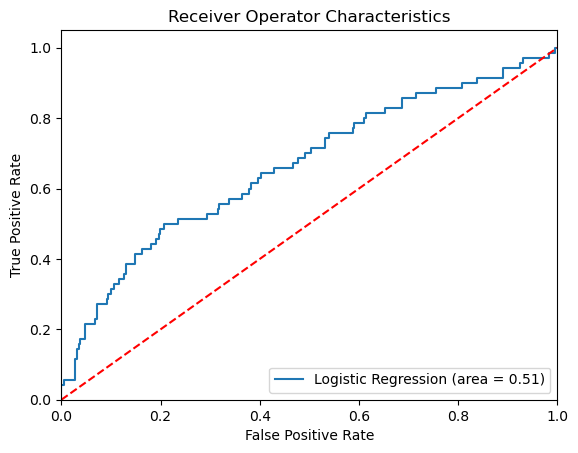

In [72]:
plt.figure()
plt.plot(fpr, tpr, label = 'Logistic Regression (area = %0.2f)' %logit_roc_auc)
plt.plot([0,1],[0,1],'r--')
plt.xlim([0.0,1.0])
plt.ylim([0.0,1.05])
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Receiver Operator Characteristics")
plt.legend(loc = "lower right")
plt.savefig('Plot_Roc') # To save the plot in some object
plt.show()

As a general rule of thumb, however, an ROC area above 0.7 or 0.8 is often considered reasonably good, while an area below 0.7 suggests that the model may need improvement.

In [73]:
import sklearn
from sklearn.feature_selection import mutual_info_classif

In [74]:
mutual_i= mutual_info_classif(x_train,y_train)

In [75]:
mutual_i

array([0.02128468, 0.01750981, 0.        , 0.        , 0.0122431 ,
       0.01927451, 0.00890306, 0.01377696, 0.00497234, 0.00151976,
       0.        , 0.00521044, 0.01956984, 0.0039006 , 0.        ,
       0.00207329, 0.03200025, 0.00974405, 0.01771656, 0.02877873,
       0.00122547, 0.        , 0.00301804, 0.03032654, 0.01520401,
       0.        , 0.        , 0.        , 0.02378303, 0.01646604,
       0.01494153])

In [76]:
mutual_i=pd.Series(mutual_i)
mutual_i.index=x_train.columns
mutual_i

Age                         0.021285
BusinessTravel              0.017510
DailyRate                   0.000000
Department                  0.000000
DistanceFromHome            0.012243
Education                   0.019275
EducationField              0.008903
EmployeeNumber              0.013777
EnvironmentSatisfaction     0.004972
Gender                      0.001520
HourlyRate                  0.000000
JobInvolvement              0.005210
JobLevel                    0.019570
JobRole                     0.003901
JobSatisfaction             0.000000
MaritalStatus               0.002073
MonthlyIncome               0.032000
MonthlyRate                 0.009744
NumCompaniesWorked          0.017717
OverTime                    0.028779
PercentSalaryHike           0.001225
PerformanceRating           0.000000
RelationshipSatisfaction    0.003018
StockOptionLevel            0.030327
TotalWorkingYears           0.015204
TrainingTimesLastYear       0.000000
WorkLifeBalance             0.000000
Y

In [77]:
mutual_i.sort_values(ascending=False)

MonthlyIncome               0.032000
StockOptionLevel            0.030327
OverTime                    0.028779
YearsInCurrentRole          0.023783
Age                         0.021285
JobLevel                    0.019570
Education                   0.019275
NumCompaniesWorked          0.017717
BusinessTravel              0.017510
YearsSinceLastPromotion     0.016466
TotalWorkingYears           0.015204
YearsWithCurrManager        0.014942
EmployeeNumber              0.013777
DistanceFromHome            0.012243
MonthlyRate                 0.009744
EducationField              0.008903
JobInvolvement              0.005210
EnvironmentSatisfaction     0.004972
JobRole                     0.003901
RelationshipSatisfaction    0.003018
MaritalStatus               0.002073
Gender                      0.001520
PercentSalaryHike           0.001225
HourlyRate                  0.000000
JobSatisfaction             0.000000
TrainingTimesLastYear       0.000000
WorkLifeBalance             0.000000
Y

<Axes: >

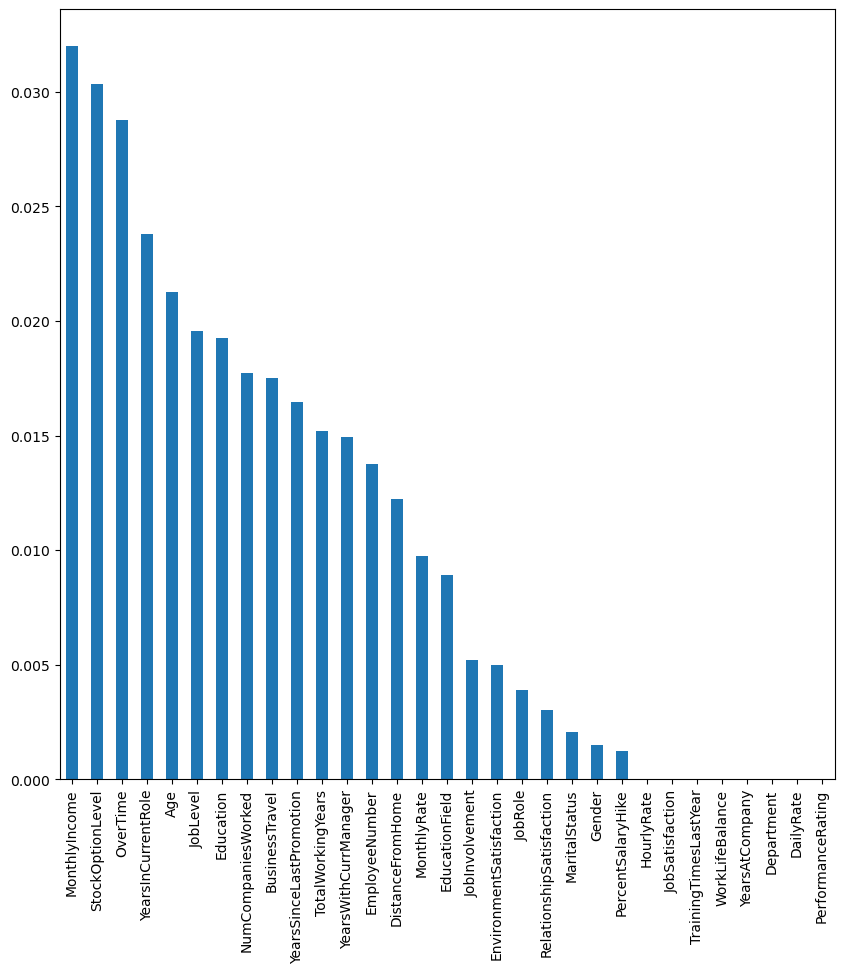

In [78]:
mutual_i.sort_values(ascending=False).plot(kind='bar',figsize=(10,10))

In [79]:
from sklearn.feature_selection import SelectKBest

In [80]:
top_21=SelectKBest(mutual_info_classif,k=21)

In [81]:
top_21.fit(x_train,y_train)

SelectKBest(k=21,
            score_func=<function mutual_info_classif at 0x0000020D72348700>)

In [82]:
top_21.get_support()

array([ True,  True,  True, False, False,  True,  True, False,  True,
       False, False,  True,  True,  True, False, False,  True, False,
        True,  True,  True,  True, False,  True,  True,  True, False,
        True,  True,  True,  True])

In [83]:
x_train.columns[top_21.get_support()]

Index(['Age', 'BusinessTravel', 'DailyRate', 'Education', 'EducationField',
       'EnvironmentSatisfaction', 'JobInvolvement', 'JobLevel', 'JobRole',
       'MonthlyIncome', 'NumCompaniesWorked', 'OverTime', 'PercentSalaryHike',
       'PerformanceRating', 'StockOptionLevel', 'TotalWorkingYears',
       'TrainingTimesLastYear', 'YearsAtCompany', 'YearsInCurrentRole',
       'YearsSinceLastPromotion', 'YearsWithCurrManager'],
      dtype='object')

In [84]:
sel_f=pd.DataFrame({'Feature':list(x_train.columns),
                   'Scores':top_21.scores_})
sel_f.sort_values(by = 'Scores', ascending=False)

,Feature,Scores
13,JobRole,0.039630
19,OverTime,0.035945
24,TotalWorkingYears,0.035439
16,MonthlyIncome,0.033358
12,JobLevel,0.031067
23,StockOptionLevel,0.029749
11,JobInvolvement,0.024273
1,BusinessTravel,0.021813
30,YearsWithCurrManager,0.018207
8,EnvironmentSatisfaction,0.018082


In [85]:
x_train=x_train[x_train.columns[top_21.get_support()]]

In [86]:
x_train.head()

,Age,BusinessTravel,DailyRate,Education,EducationField,EnvironmentSatisfaction,JobInvolvement,JobLevel,JobRole,MonthlyIncome,...,OverTime,PercentSalaryHike,PerformanceRating,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
178,46,1,526,2,3,2,3,3,0,10453,...,1,25,4,3,24,2,24,13,15,7
971,51,1,1405,2,4,4,2,4,3,13142,...,1,16,3,0,29,1,5,2,0,3
1172,29,1,469,3,2,3,2,2,0,5869,...,1,11,3,0,8,2,5,2,1,4
667,41,1,1085,4,0,2,1,1,2,2778,...,0,13,3,1,10,1,7,7,1,0
399,31,1,329,2,0,4,2,1,2,2218,...,1,12,3,1,4,3,4,2,3,2


In [87]:
y_train.head()

178     0
971     0
1172    0
667     1
399     0
Name: Attrition, dtype: int64

In [88]:
x_test=x_test[x_test.columns[top_21.get_support()]]
x_test.head()

,Age,BusinessTravel,DailyRate,Education,EducationField,EnvironmentSatisfaction,JobInvolvement,JobLevel,JobRole,MonthlyIncome,...,OverTime,PercentSalaryHike,PerformanceRating,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
880,32,2,116,3,1,3,2,1,2,2743,...,1,20,4,1,2,2,2,2,2,2
152,53,1,1436,2,3,2,3,2,6,2306,...,0,20,4,1,13,3,7,7,4,5
1466,39,1,613,1,2,4,2,3,4,9991,...,1,15,3,1,9,5,7,7,1,7
1084,34,1,971,3,4,4,2,3,0,7083,...,0,14,3,0,10,3,10,9,8,6
1086,50,2,333,5,2,3,1,4,7,14411,...,0,13,3,0,32,2,32,6,13,9


In [89]:
logreg = LogisticRegression()
logreg.fit(x_train, y_train)

C:\Users\sagar\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


LogisticRegression()

In [90]:
## Get prediction on test data using trauned model
## Store the prediction in y_pred object
y_pred = logreg.predict(x_test)

In [91]:
y_pred

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,

In [92]:
print('Accuracy of the log Regn Classifier on Test data is: {:.2f}'.format(logreg.score(x_test, y_test)))

Accuracy of the log Regn Classifier on Test data is: 0.84


## Building the Confusion Matrix

In [93]:
from sklearn.metrics import confusion_matrix
confusion_matrix = confusion_matrix(y_test, y_pred)
print(confusion_matrix)

[[364   7]
 [ 64   6]]


In [94]:
y_test

880     0
152     0
1466    0
1084    0
1086    0
       ..
882     0
1388    0
380     0
573     1
221     0
Name: Attrition, Length: 441, dtype: int64

In [95]:
y_pred_df = pd.DataFrame(y_pred)

In [96]:
y_pred_df.head()

,0
0,0
1,0
2,0
3,0
4,0


## Confusion Matrix Plot

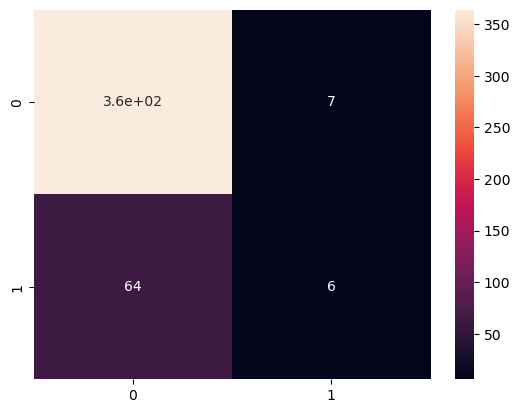

In [97]:
import seaborn as sn
sn.heatmap(confusion_matrix, annot = True)
import matplotlib.pyplot as plt
plt.show()

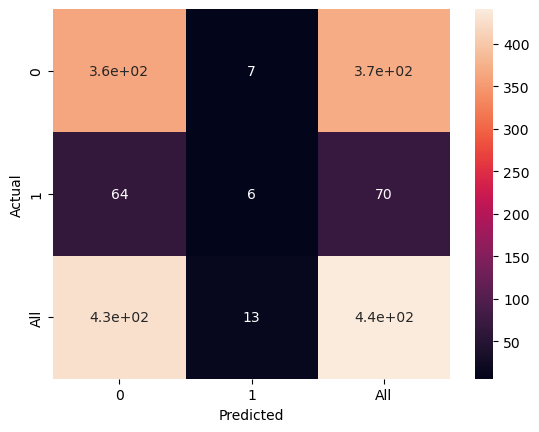

In [98]:
confusion_matrix_new = pd.crosstab(y_test, y_pred, rownames=['Actual'], colnames=['Predicted'], margins = True)
sn.heatmap(confusion_matrix_new, annot = True)
plt.show()

In [99]:
# print(metrics.accuracy_score(y_test, y_pred))
Accuracy = metrics.accuracy_score(y_test, y_pred)
print(Accuracy)

0.8390022675736961


In [100]:
Overall_Error_Rate = 1-Accuracy
print(Overall_Error_Rate)

0.16099773242630389


In [101]:
# print(metrics.precision_score(y_test, y_pred))
Precision = metrics.precision_score(y_test, y_pred)
print(Precision)

0.46153846153846156


In [102]:
Sensitivity_recall = metrics.recall_score(y_test, y_pred)
print(Sensitivity_recall)

0.08571428571428572


In [103]:
Specificity = metrics.recall_score(y_test, y_pred, pos_label = 0)
print(Specificity)

0.9811320754716981


In [104]:
# F-score is the harmonic mean of precision and sensitivity
# it considers both false positive and false negative cases and is good for imbalanced datasets.
# 2 * ((precision * sensitivity)/precision + sensitivity)
F1_score = metrics.f1_score(y_test, y_pred)

In [105]:
print({'Accuracy: ':Accuracy, "Precision: ":Precision, "Sensitivity_recall: ":Sensitivity_recall, "Specificity: ":Specificity,"F1_score":F1_score})

{'Accuracy: ': 0.8390022675736961, 'Precision: ': 0.46153846153846156, 'Sensitivity_recall: ': 0.08571428571428572, 'Specificity: ': 0.9811320754716981, 'F1_score': 0.14457831325301204}


In [106]:
FPR = 1 - Specificity
FNR = 1 - Sensitivity_recall
print({"False Positive Rate":FPR,"False Negative Rate":FNR})

{'False Positive Rate': 0.018867924528301883, 'False Negative Rate': 0.9142857142857143}


In [107]:
# Hamming Loss is the fraction of targets that are misclassified
# also called as Overall Error Rate , Misclassification Rate

hamming_loss = metrics.hamming_loss(y_test, y_pred)
hamming_loss

0.16099773242630386

## Build ROC

In [108]:
logit_roc_auc = roc_auc_score(y_test, logreg.predict(x_test))
# Defining method used for Roc and Auc
fpr, tpr, thresholds = roc_curve(y_test, logreg.predict_proba(x_test)[:,1])
# Print probability data frame from column 2 which has Index = 1

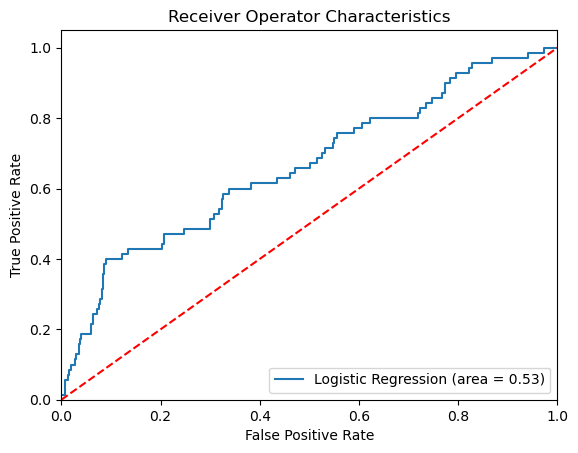

In [109]:
plt.figure()
plt.plot(fpr, tpr, label = 'Logistic Regression (area = %0.2f)' %logit_roc_auc)
plt.plot([0,1],[0,1],'r--')
plt.xlim([0.0,1.0])
plt.ylim([0.0,1.05])
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Receiver Operator Characteristics")
plt.legend(loc = "lower right")
plt.savefig('Plot_Roc') # To save the plot in some object
plt.show()

# Decision Tree

In [115]:
from sklearn import tree
DTCL=tree.DecisionTreeClassifier() 
DTCL.fit(x_train,y_train)

DecisionTreeClassifier()

In [116]:
y_pred1=DTCL.predict(x_test)

In [120]:
from sklearn.metrics import confusion_matrix
confusion_matrix = confusion_matrix(y_test, y_pred1)
print('Confusion matrix is:\n', confusion_matrix)

Confusion matrix is:
 [[321  50]
 [ 38  32]]


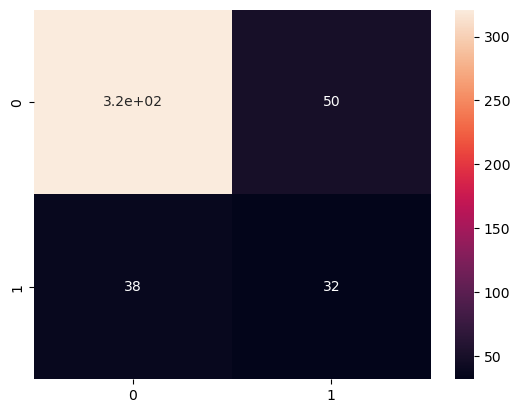

In [121]:
import seaborn as sn
sn.heatmap(confusion_matrix, annot = True)
import matplotlib.pyplot as plt
plt.show()

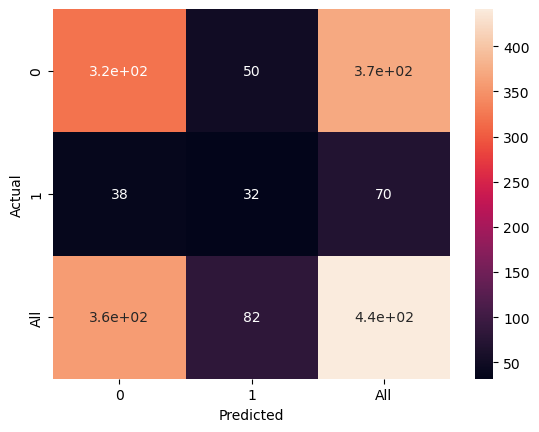

In [156]:
confusion_matrix_new = pd.crosstab(y_test, y_pred1, rownames=['Actual'], colnames=['Predicted'], margins = True)
sn.heatmap(confusion_matrix_new, annot = True)
plt.show()

In [123]:
from sklearn.metrics import confusion_matrix, accuracy_score, recall_score
# print(metrics.accuracy_score(y_test, y_pred))
Accuracy = metrics.accuracy_score(y_test, y_pred1)
print(Accuracy)

0.800453514739229


In [124]:
Overall_Error_Rate = 1-Accuracy
print(Overall_Error_Rate)

0.199546485260771


In [125]:
# print(metrics.precision_score(y_test, y_pred))
Precision = metrics.precision_score(y_test, y_pred1)
print(Precision)

0.3902439024390244


In [126]:
Sensitivity_recall = metrics.recall_score(y_test, y_pred1)
print(Sensitivity_recall)

0.45714285714285713


In [127]:
Specificity = metrics.recall_score(y_test, y_pred1, pos_label = 0)
print(Specificity)

0.8652291105121294


In [128]:
# F-score is the harmonic mean of precision and sensitivity
# it considers both false positive and false negative cases and is good for imbalanced datasets.
# 2 * ((precision * sensitivity)/precision + sensitivity)
F1_score = metrics.f1_score(y_test, y_pred1)

In [129]:
print({'Accuracy: ':Accuracy, "Precision: ":Precision, "Sensitivity_recall: ":Sensitivity_recall, "Specificity: ":Specificity,"F1_score":F1_score})

{'Accuracy: ': 0.800453514739229, 'Precision: ': 0.3902439024390244, 'Sensitivity_recall: ': 0.45714285714285713, 'Specificity: ': 0.8652291105121294, 'F1_score': 0.42105263157894735}


In [130]:
# Hamming Loss is the fraction of targets that are misclassified
# also called as Overall Error Rate , Misclassification Rate

hamming_loss = metrics.hamming_loss(y_test, y_pred1)
hamming_loss

0.19954648526077098

## Build ROC

In [131]:
y_pred_prob_dtcl = DTCL.predict_proba(x_test)[:, 1]

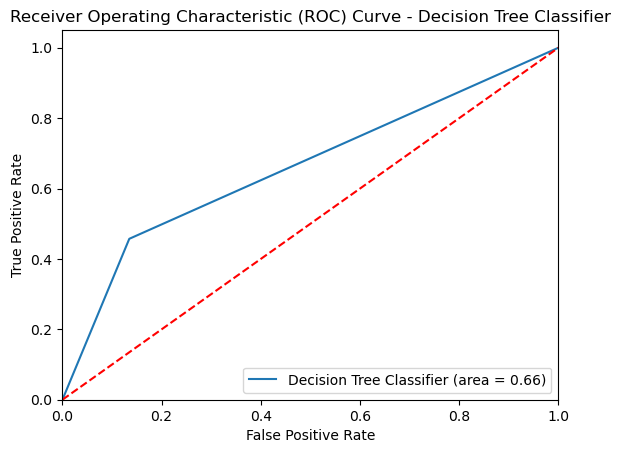

In [132]:
fpr_dtcl, tpr_dtcl, thresholds_dtcl = roc_curve(y_test, y_pred1)

dtcl_roc_auc = roc_auc_score(y_test, y_pred1)

plt.figure()
plt.plot(fpr_dtcl, tpr_dtcl, label='Decision Tree Classifier (area = %0.2f)' % dtcl_roc_auc)
plt.plot([0, 1], [0, 1], 'r--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Receiver Operating Characteristic (ROC) Curve - Decision Tree Classifier")
plt.legend(loc="lower right")
# plt.savefig('ROC_Curve_DTCL.png')  # To save the plot as an image (optional)
plt.show()

In [133]:
from sklearn.ensemble import RandomForestClassifier
RFC = RandomForestClassifier()

In [134]:
RFC.fit(x_train,y_train)

RandomForestClassifier()

In [135]:
y_pred_RFC=RFC.predict(x_test)

In [140]:
from sklearn.metrics import precision_score, f1_score, confusion_matrix
confusion_matrix = confusion_matrix(y_test,y_pred_RFC)

print('confusion matrix is \n',confusion_matrix)
print("")
print('Accuracy score is',accuracy_score(y_test,y_pred_RFC))
print('recall score is',recall_score(y_test,y_pred_RFC,average='weighted'),)
print('precision score is',precision_score(y_test,y_pred_RFC,average='weighted'))
print('f1 score is',f1_score(y_test,y_pred_RFC,average='weighted'))

confusion matrix is 
 [[366   5]
 [ 58  12]]

Accuracy score is 0.8571428571428571
recall score is 0.8571428571428571
precision score is 0.8382352941176471
f1 score is 0.8183908045977011


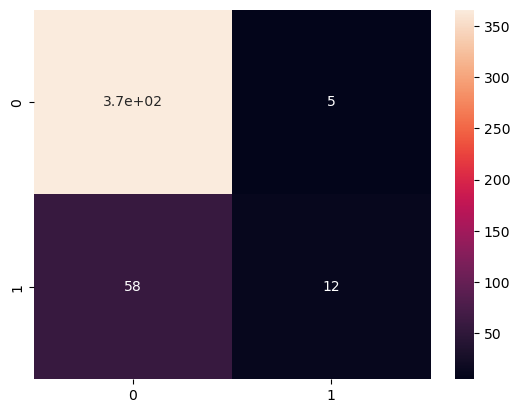

In [141]:
import seaborn as sn
sn.heatmap(confusion_matrix, annot = True)
import matplotlib.pyplot as plt
plt.show()

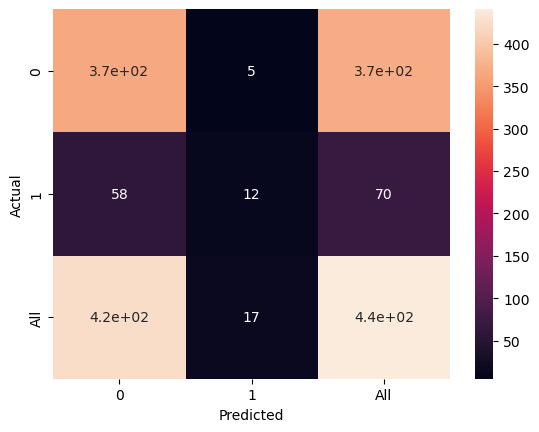

In [157]:
confusion_matrix_new = pd.crosstab(y_test, y_pred_RFC, rownames=['Actual'], colnames=['Predicted'], margins = True)
sn.heatmap(confusion_matrix_new, annot = True)
plt.show()

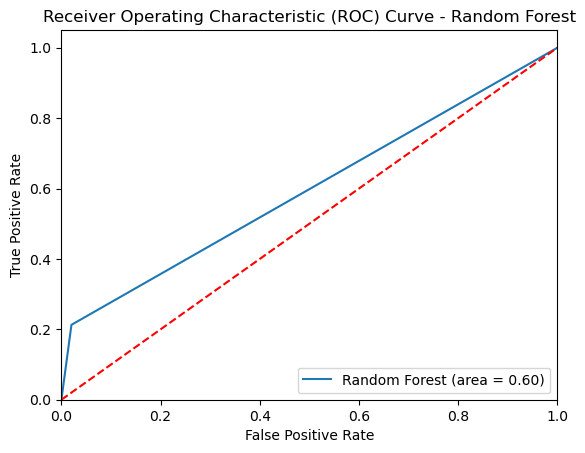

In [289]:
fpr_rf, tpr_rf, thresholds_rf = roc_curve(y_test, y_pred_RFC)

rf_roc_auc = roc_auc_score(y_test, y_pred_RFC)


plt.figure()
plt.plot(fpr_rf, tpr_rf, label='Random Forest (area = %0.2f)' % rf_roc_auc)
plt.plot([0, 1], [0, 1], 'r--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Receiver Operating Characteristic (ROC) Curve - Random Forest")
plt.legend(loc="lower right")
# plt.savefig('ROC_Curve_RandomForest.png')  
plt.show()

In [158]:
from sklearn import neighbors

In [159]:
Knn=neighbors.KNeighborsClassifier()
Knn.fit(x_train,y_train)

KNeighborsClassifier()

In [160]:
y_pred2=Knn.predict(x_test)

In [161]:
from sklearn.metrics import confusion_matrix

confusion_matrix_ = confusion_matrix(y_test,y_pred2)
print('confusion matrix is \n',confusion_matrix_)
print("")
print('Accuracy score is',accuracy_score(y_test,y_pred2))
print('recall score is',recall_score(y_test,y_pred2,average='weighted'),)
print('precision score is',precision_score(y_test,y_pred2,average='weighted'))
print('f1 score is',f1_score(y_test,y_pred2,average='weighted'))

confusion matrix is 
 [[351  20]
 [ 64   6]]

Accuracy score is 0.8095238095238095
recall score is 0.8095238095238095
precision score is 0.7481618782823601
f1 score is 0.7712044105173876


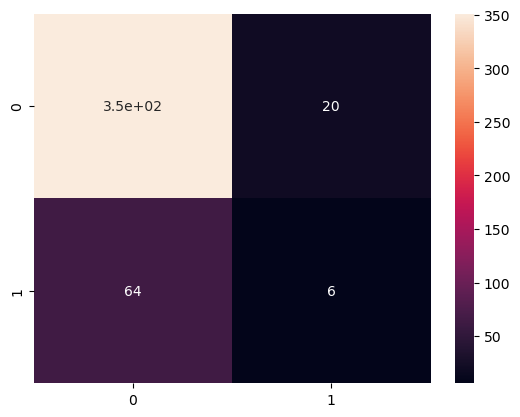

In [162]:
import seaborn as sn
sn.heatmap(confusion_matrix_, annot = True)
import matplotlib.pyplot as plt
plt.show()

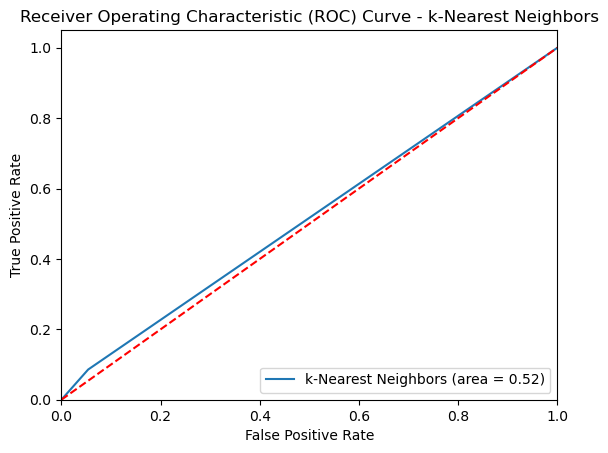

In [163]:
fpr_knn, tpr_knn, thresholds_knn = roc_curve(y_test, y_pred2)

# Calculate the AUC score for KNN
knn_roc_auc = roc_auc_score(y_test, y_pred2)

# Plot the ROC curve for KNN
plt.figure()
plt.plot(fpr_knn, tpr_knn, label='k-Nearest Neighbors (area = %0.2f)' % knn_roc_auc)
plt.plot([0, 1], [0, 1], 'r--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Receiver Operating Characteristic (ROC) Curve - k-Nearest Neighbors")
plt.legend(loc="lower right")
# plt.savefig('ROC_Curve_KNN.png') 
plt.show()

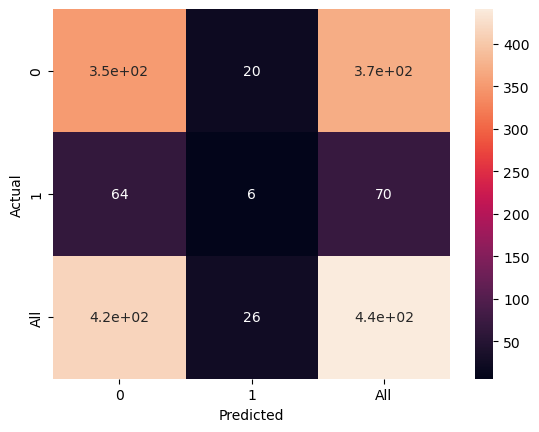

In [164]:
confusion_matrix_new = pd.crosstab(y_test, y_pred2, rownames=['Actual'], colnames=['Predicted'], margins = True)
sn.heatmap(confusion_matrix_new, annot = True)
plt.show()

In [165]:
from sklearn import svm

In [166]:
SVC = svm.SVC()
SVC.fit(x_train,y_train)

SVC()

In [167]:
y_pred_SVC=SVC.predict(x_test)

In [168]:
confusion_matrix_ = confusion_matrix(y_test,y_pred_SVC)
print('confusion matrix is \n',confusion_matrix_)
print('Accuracy score is',accuracy_score(y_test,y_pred_SVC))

print('recall score is',recall_score(y_test,y_pred_SVC,average='weighted'),)
print('precision score is',precision_score(y_test,y_pred_SVC,average='weighted'))
print('f1 score is',f1_score(y_test,y_pred_SVC,average='weighted'))

confusion matrix is 
 [[371   0]
 [ 70   0]]
Accuracy score is 0.8412698412698413
recall score is 0.8412698412698413
precision score is 0.707734945830184
f1 score is 0.7687465790914066


C:\Users\sagar\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


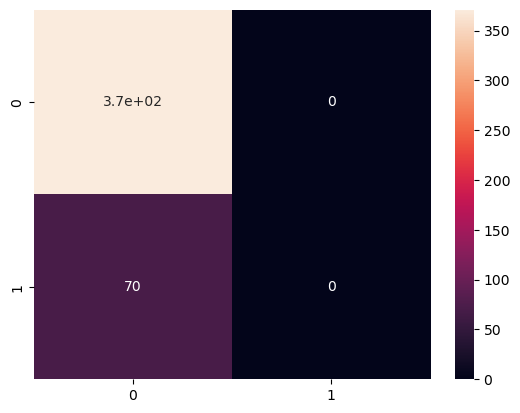

In [169]:
import seaborn as sn
sn.heatmap(confusion_matrix_, annot = True)
import matplotlib.pyplot as plt
plt.show()

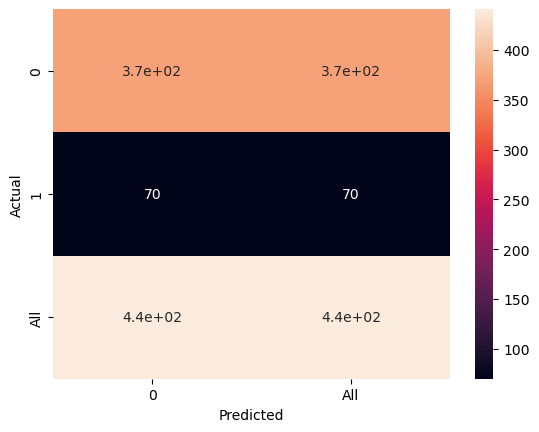

In [170]:
confusion_matrix_new = pd.crosstab(y_test, y_pred_SVC, rownames=['Actual'], colnames=['Predicted'], margins = True)
sn.heatmap(confusion_matrix_new, annot = True)
plt.show()

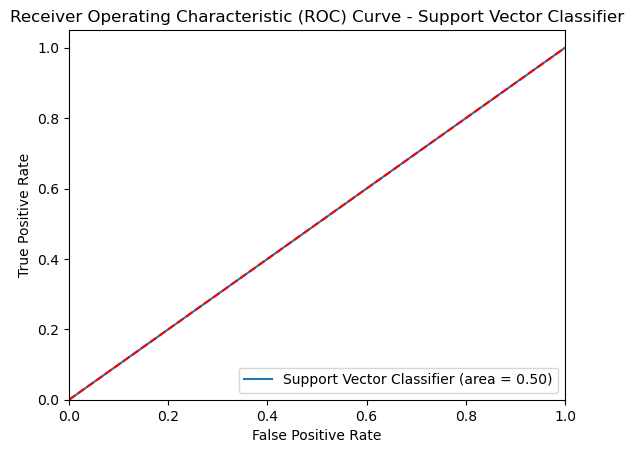

In [171]:
fpr_svc, tpr_svc, thresholds_svc = roc_curve(y_test, y_pred_SVC)

# Calculate the AUC score for SVC
svc_roc_auc = roc_auc_score(y_test, y_pred_SVC)

# Plot the ROC curve
plt.figure()
plt.plot(fpr_svc, tpr_svc, label='Support Vector Classifier (area = %0.2f)' % svc_roc_auc)
plt.plot([0, 1], [0, 1], 'r--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Receiver Operating Characteristic (ROC) Curve - Support Vector Classifier")
plt.legend(loc="lower right")
# plt.savefig('ROC_Curve_SVC.png')
plt.show()

# Final Conclusion

Logistic Regression (Base Model): Achieved decent accuracy, but low sensitivity/recall indicates it might not be good at identifying positive cases.

Logistic Regression (after feature selection): Lower accuracy compared to the base model, but higher specificity. The F1-score is higher, suggesting better balance between precision and recall.

Decision Tree Classifier: Moderate accuracy and precision, with good sensitivity/recall. It might be worth considering if interpretability is essential.

Random Forest Classifier: Higher accuracy compared to other models, good recall, and precision.

KNN Classifier: Moderate accuracy, decent recall, and precision.

SVM: Good accuracy but struggles with recall, and precision is moderate.

# Comparing the two models:

For Random Forest Classifier:

Accuracy score: 0.8571,
Recall score: 0.8571,
Precision score: 0.8382,
F1 score: 0.8184,
ROC area: 0.60
    
For Decision Tree Classifier:

Accuracy score: 0.8005,
Recall score: 0.4571,
Precision score: 0.3902,
F1 score: 0.4211,
ROC area: 0.66



Accuracy: Random Forest has a higher accuracy, indicating that it predicts correctly more often.

Recall: Random Forest has a significantly higher recall score, indicating that it can better identify positive cases.

Precision: Random Forest has a higher precision score, suggesting it provides more accurate positive predictions.

F1-score: Random Forest has a higher F1-score, which takes into account both precision and recall, providing a better balance between the two.

ROC area: Random Forest has a slightly lower ROC area, but this metric alone is not enough to determine the model's overall performance.